# __Machine Learning for Prioritizing Blood Pressure Genes__ 

In [53]:
import re

import numpy as np
import pandas as pd
import scipy.cluster
from numpy import absolute, mean, sort, std
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import matplotlib.pylab as plt
import seaborn as sns
import shap
import statsmodels.api as sm

%matplotlib inline
%config InlineBackend.figure_format ='retina'
from sklearn.ensemble import GradientBoostingRegressor
from BorutaShap import BorutaShap
from matplotlib.pyplot import cm
from missingpy import MissForest
from sklearn import datasets, metrics, model_selection, preprocessing
from sklearn.metrics import (
    explained_variance_score,
    max_error,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    LeaveOneOut,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_val_predict,
    cross_val_score,
    cross_validate,
    learning_curve,
    train_test_split,
    validation_curve,
)
from skopt import BayesSearchCV
from skopt.plots import plot_convergence

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)

import warnings

# import dash
# import dash_core_components as dcc
# import dash_html_components as html
# import dash_table
# import matplotlib
# import matplotlib.pyplot as plt
# import plotly
# import plotly.express as px
# import plotly.figure_factory as FF
# from dash.dependencies import Input, Output
# from jupyter_dash import JupyterDash

warnings.simplefilter(action="ignore", category=FutureWarning)
from warnings import filterwarnings

filterwarnings("ignore")

seed = 0

In [54]:
data = pd.read_csv("training_cleaned.csv", header=0, sep=",")

In [55]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 0.75, "least likely": 0.1}
)
Y = data["BPlabel_encoded"]
data = data.drop(["BPlabel"], 1)
data.shape

(293, 60)

In [56]:
X_total = pd.read_csv("imputed_training_data.csv", header=0)
X_total.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_total.columns.values
]

### Load Boruta Shap Feature Selected Features

In [57]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]



In [58]:
df_gene = data[["Gene"]]

X = pd.concat([df_gene, X], axis=1)

X = X.set_index("Gene")

In [59]:
X_train,X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, random_state=0
)

In [60]:
gb = GradientBoostingRegressor(random_state=seed, criterion='mse', learning_rate=0.10543444192060113, max_depth=4, max_features='sqrt', n_estimators=50)

In [61]:
outer_cv = RepeatedKFold(random_state=seed)

scoring = ['r2', 'neg_mean_squared_error', 'max_error', 'neg_mean_absolute_error',
          'explained_variance','neg_root_mean_squared_error',
           'neg_median_absolute_error'] 

cv_result = model_selection.cross_validate(gb, X, Y, cv=outer_cv, scoring=scoring)

In [62]:
np.median(cv_result['test_r2'])

0.7175201831685148

### Leave One Out Cross-validation

In [63]:
cv = LeaveOneOut()
scores = cross_val_score(
    gb, X, Y, scoring="neg_mean_squared_error", cv=cv, n_jobs=-1
)
scores = absolute(scores)
print("MAE: %.3f (%.3f)" % (mean(scores), std(scores)))

MAE: 0.035 (0.072)


In [64]:
gb.fit(X_train, Y_train)
y_true = Y
y_pred = gb.predict(X_test_borsel)
r2 = r2_score(Y_test, y_pred)
n =X_test.shape[0]
p =X_test.shape[1]
adj_rsquared = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
print("Adjusted R Squared: {}".format(adj_rsquared))

Adjusted R Squared: 0.6382110283948521


### Predicted r2 vs r2

Predicted r2:
- It removes a data point from the dataset.
- Calculates the regression equation.
- Evaluates how well the model predicts the missing observation.
- And, repeats this for all data points in the dataset.

In [65]:
gb.fit(X, Y)
y_true = Y
y_pred = gb.predict(X)
xs = X


def press_statistic(y_true, y_pred, xs):
    res = y_pred - y_true
    hat = xs.dot(np.linalg.pinv(xs))
    den = 1 - np.diagonal(hat)
    sqr = np.square(res / den)
    return sqr.sum()


def predicted_r2(y_true, y_pred, xs):
    press = press_statistic(y_true=y_true, y_pred=y_pred, xs=xs)
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - press / sst


def r2(y_true, y_pred):
    sse = np.square(y_pred - y_true).sum()
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - sse / sst


print("gb r2:", r2(y_true, y_pred))
print("gb Predicted r2:", predicted_r2(y_true, y_pred, xs))

gb r2: 0.9574084932111909
gb Predicted r2: 0.851920559615303


### Visualize Model Performance:

In [66]:
def perform_repeated_cv(X, Y, model):
    # set random seed for repeartability
    #    random.seed(1)

    # set the number of repetitions
    n_reps = 100

    # perform repeated cross validation
    r2_scores = np.zeros(n_reps)
    mse_scores = np.zeros(n_reps)

    for u in range(n_reps):

        # randomly shuffle the dataset
        indices = np.arange(X.shape[0])
        np.random.shuffle(indices)
        X = X.iloc[indices]
        Y = Y.iloc[indices]  # dataset has been randomly shuffled

        # initialize vector to keep predictions from all folds of the cross-validation
        y_predicted = np.zeros(Y.shape)

        # perform 10-fold cross validation
        kf = KFold(n_splits=5, random_state=seed)
        for train, test in kf.split(X):

            # split the dataset into training and testing
            X_train = X.iloc[train]
            X_test = X.iloc[test]
            y_train = Y.iloc[train]
            y_test = Y.iloc[test]

            # train model
            cat = model
            cat.fit(X_train, y_train)

            # make predictions on the testing set
            y_predicted[test] = cat.predict(X_test)

        # record scores
        r2_scores[u] = r2_score(Y, y_predicted)
        mse_scores[u] = mean_squared_error(Y, y_predicted)

    # return all scores
    return r2_scores, mse_scores

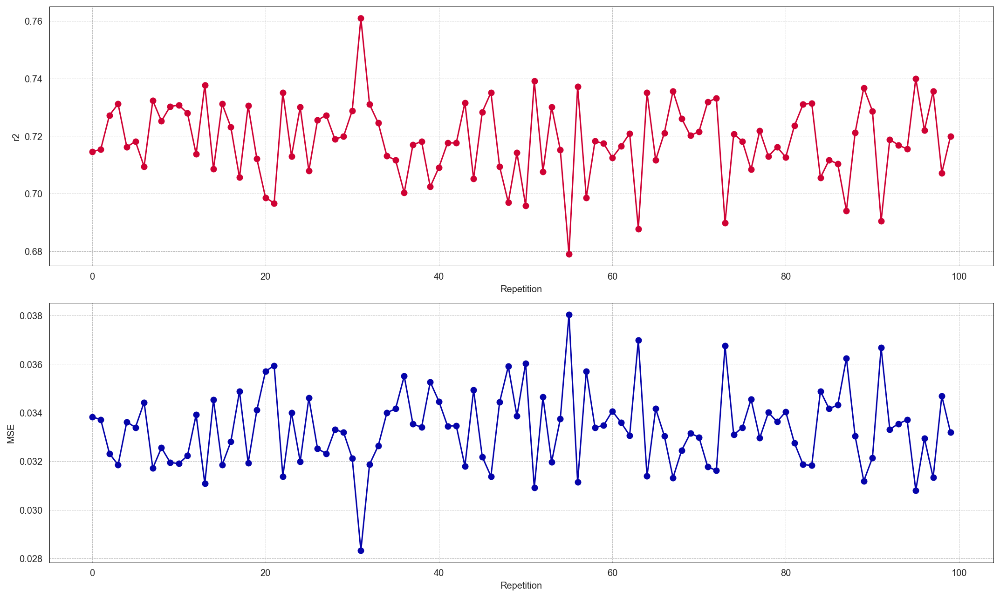

In [67]:
r2_scores, mse_scores = perform_repeated_cv(X, Y, gb)

# plot results from the 100 repetitions
fig, axes = plt.subplots(2, 1)

axes[0].plot(r2_scores, color="xkcd:cherry", marker="o")
axes[0].set_xlabel("Repetition")
axes[0].set_ylabel("r2")
axes[0].set_facecolor((1, 1, 1))
axes[0].spines["left"].set_color("black")
axes[0].spines["right"].set_color("black")
axes[0].spines["top"].set_color("black")
axes[0].spines["bottom"].set_color("black")
axes[0].spines["left"].set_linewidth(0.5)
axes[0].spines["right"].set_linewidth(0.5)
axes[0].spines["top"].set_linewidth(0.5)
axes[0].spines["bottom"].set_linewidth(0.5)
axes[0].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)

axes[1].plot(mse_scores, color="xkcd:royal blue", marker="o")
axes[1].set_xlabel("Repetition")
axes[1].set_ylabel("MSE")
axes[1].set_facecolor((1, 1, 1))
axes[1].spines["left"].set_color("black")
axes[1].spines["right"].set_color("black")
axes[1].spines["top"].set_color("black")
axes[1].spines["bottom"].set_color("black")
axes[1].spines["left"].set_linewidth(0.5)
axes[1].spines["right"].set_linewidth(0.5)
axes[1].spines["top"].set_linewidth(0.5)
axes[1].spines["bottom"].set_linewidth(0.5)
axes[1].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)


plt.grid(True)
plt.tight_layout()

### Training Data Prediction Visualization:

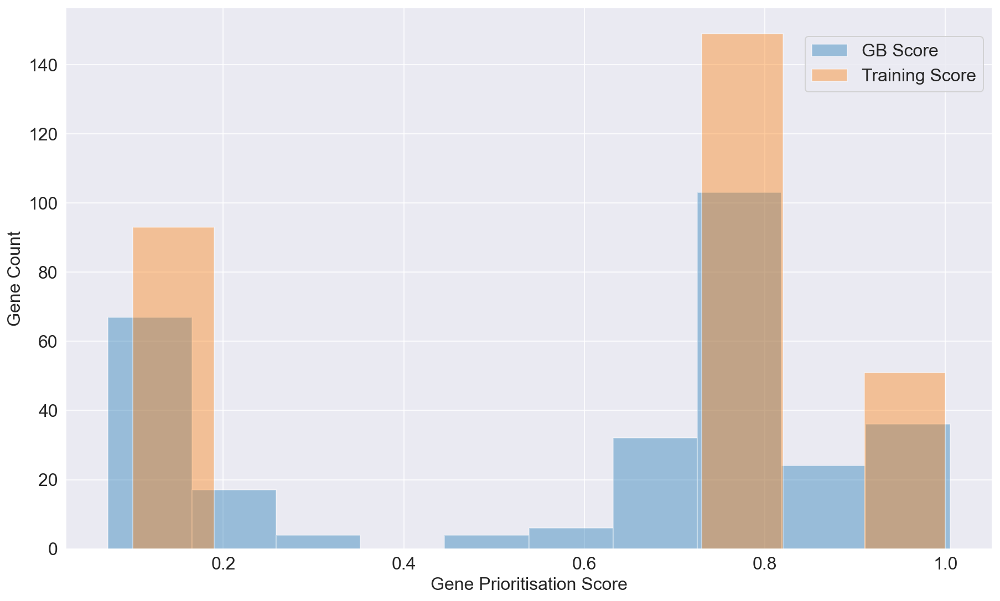

In [68]:
gb.fit(X_train, Y_train)
predictions = list(gb.predict(X))

output = pd.Series(data=predictions, index=X.index, name="GB_Score")

df_total_training = pd.concat([X, output], axis=1)

df_total = pd.concat([X, output], axis=1)

fig, ax = plt.subplots()

sns.distplot(df_total["GB_Score"], ax=ax, kde=False, norm_hist=False, bins=10)
sns.distplot(Y, ax=ax, kde=False, bins=10)
fig.legend(
    labels=["GB Score", "Training Score"],
    loc="upper right",
    bbox_to_anchor=(0.83, 0.8),
    ncol=1,
    fontsize=16,
)
ax.set_xlabel("Gene Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

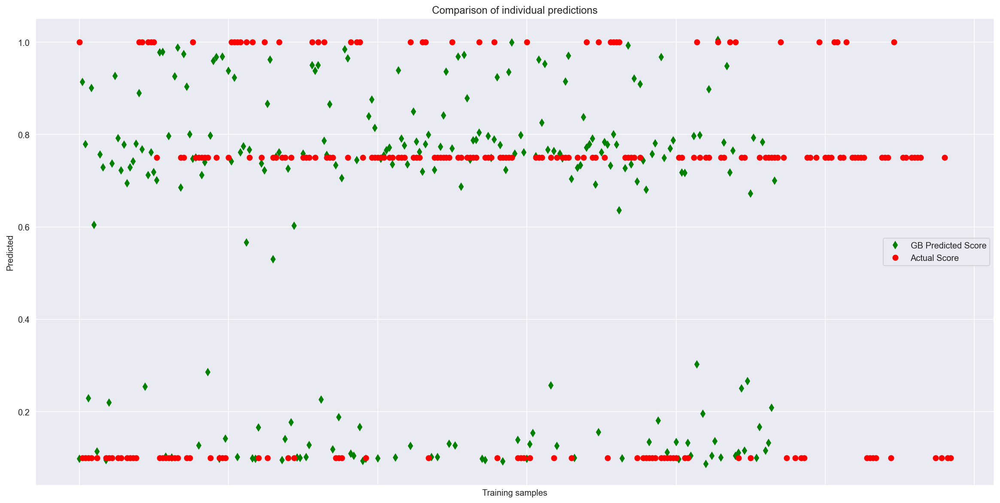

In [69]:
model1 = gb.fit(X_train, Y_train)

model1.fit(X_train, Y_train)

xt = X_train[:293]
yt = Y_train[:293]

plt.figure(figsize=(20, 10))
plt.plot(model1.predict(xt), "gd", label="GB Predicted Score")
plt.plot(yt, "or", label="Actual Score")
plt.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
plt.ylabel("Predicted")
plt.xlabel("Training samples")
plt.legend(loc="best")
plt.title("Comparison of individual predictions")
plt.show()

In [73]:
predictions = list(gb.predict(X))

output = pd.Series(data=predictions, index=X.index, name="GB_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

,Gene,GB_Score
0,ABCC9,0.972267
1,AC006455.1,0.155489
2,AC007216.2,0.109502
3,AC007461.1,0.127721
4,AC008498.1,0.098545
...,...,...
288,YES1,0.793474
289,Z98049.1,0.095535
290,ZAP70,0.749216
291,ZMYM6NB,0.097546


In [74]:
print(data[["Gene", "BPlabel_encoded"]])

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

           Gene  BPlabel_encoded
0         ABCC9             1.00
1    AC006455.1             0.10
2    AC007216.2             0.10
3    AC007461.1             0.10
4    AC008498.1             0.10
..          ...              ...
288        YES1             0.75
289    Z98049.1             0.10
290       ZAP70             0.75
291     ZMYM6NB             0.10
292     ZSCAN5D             0.10

[293 rows x 2 columns]


,Gene,GB_Score,BPlabel_encoded
0,ABCC9,0.972267,1.00
1,AC006455.1,0.155489,0.10
2,AC007216.2,0.109502,0.10
3,AC007461.1,0.127721,0.10
4,AC008498.1,0.098545,0.10
...,...,...,...
288,YES1,0.793474,0.75
289,Z98049.1,0.095535,0.10
290,ZAP70,0.749216,0.75
291,ZMYM6NB,0.097546,0.10


### SHAP Feature Importance Visualization:

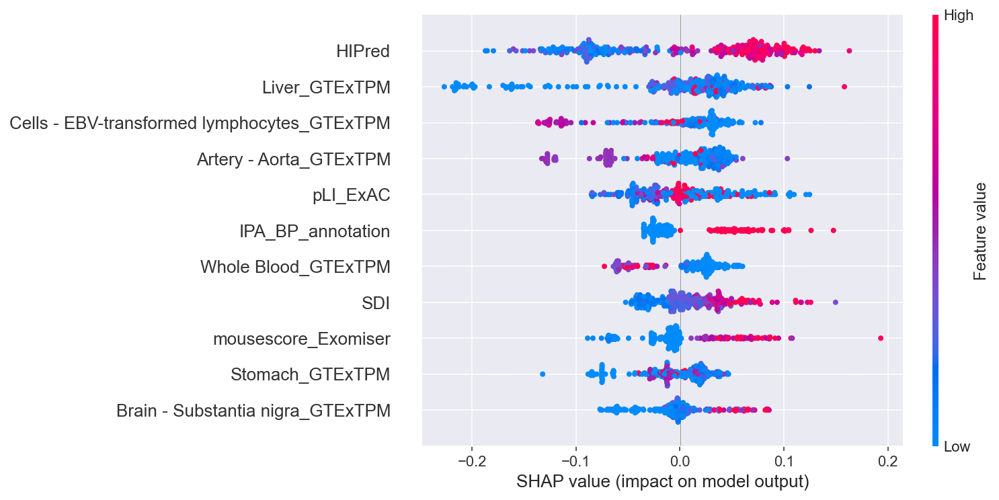

In [75]:
gb.fit(X, Y)
X_importance =X_test
explainer = shap.TreeExplainer(gb)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

In [76]:
gb.fit(X_train, Y_train)
df3 = pd.DataFrame(data=X, columns=X.columns)
df3.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]
X_importance =X_test
explainer = shap.TreeExplainer(gb)
shap_values = explainer.shap_values(X_importance)
X_importance = pd.DataFrame(data=X_test_borsel, columns=df3.columns)

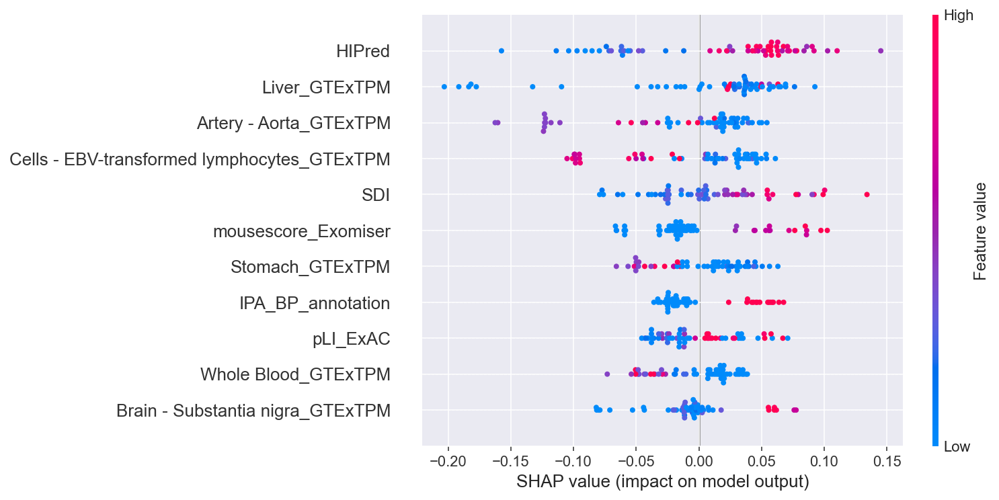

In [77]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values, X_importance)
fig.savefig('shap_summary.svg', format='svg', dpi=1200, bbox_inches = "tight")

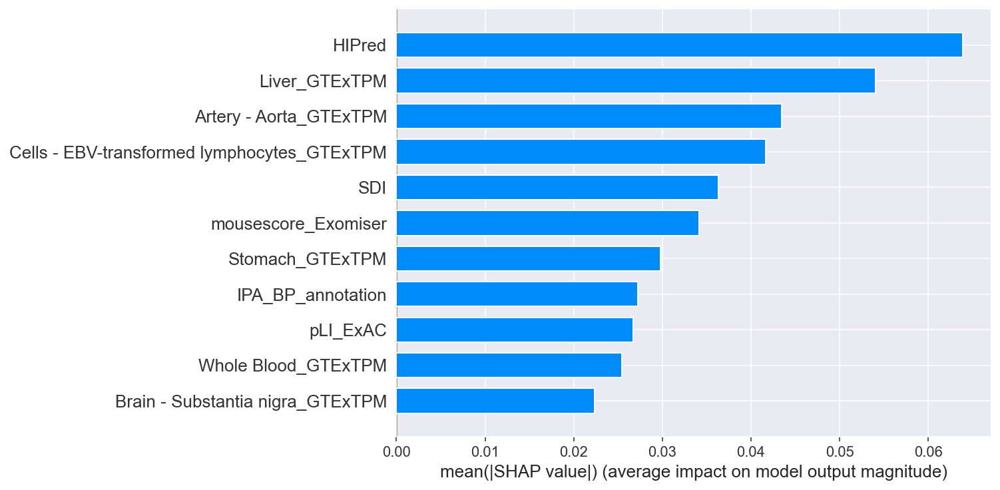

In [78]:
shap.summary_plot(shap_values, X_importance, plot_type="bar")

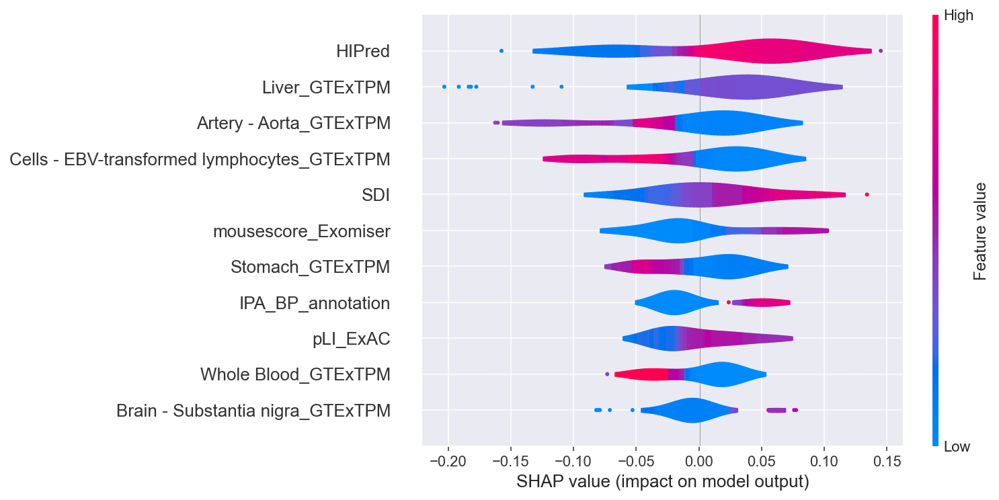

In [79]:
shap.summary_plot(shap_values, X_importance, plot_type="violin", color="coolwarm")

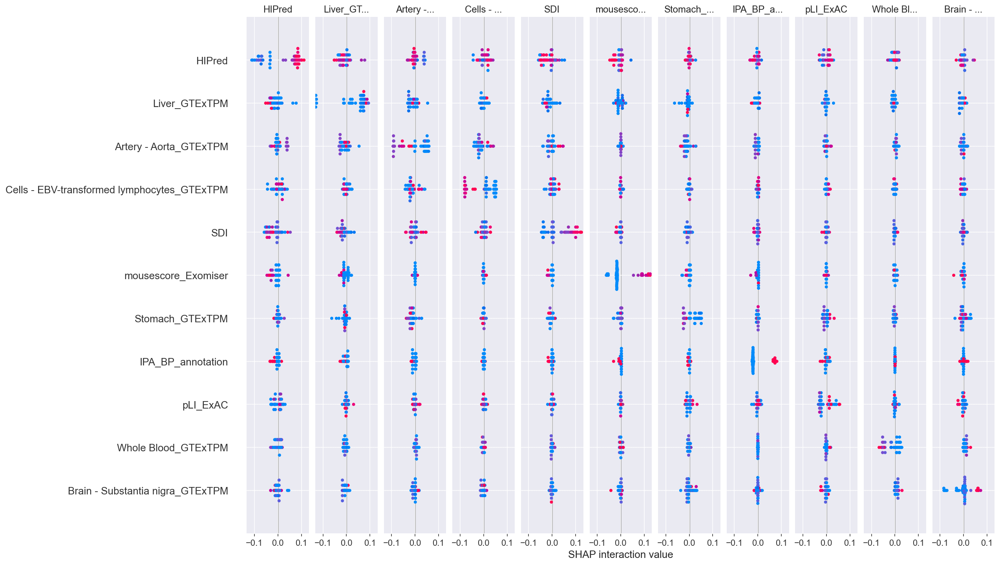

In [29]:
X_interaction =X_test
shap_interaction_values = shap.TreeExplainer(gb).shap_interaction_values(X_interaction)
X_interaction2 = pd.DataFrame(data=X_interaction, columns=df3.columns)
shap.summary_plot(shap_interaction_values, X_interaction2, max_display=11)

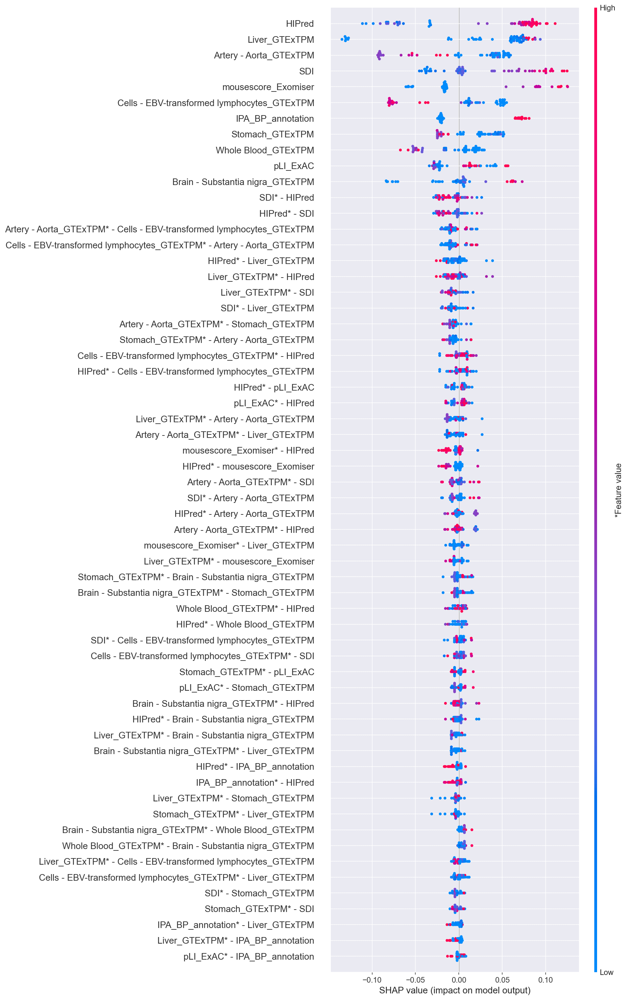

In [30]:
shap.summary_plot(
    shap_interaction_values, X_interaction2, max_display=60, plot_type="compact_dot"
)

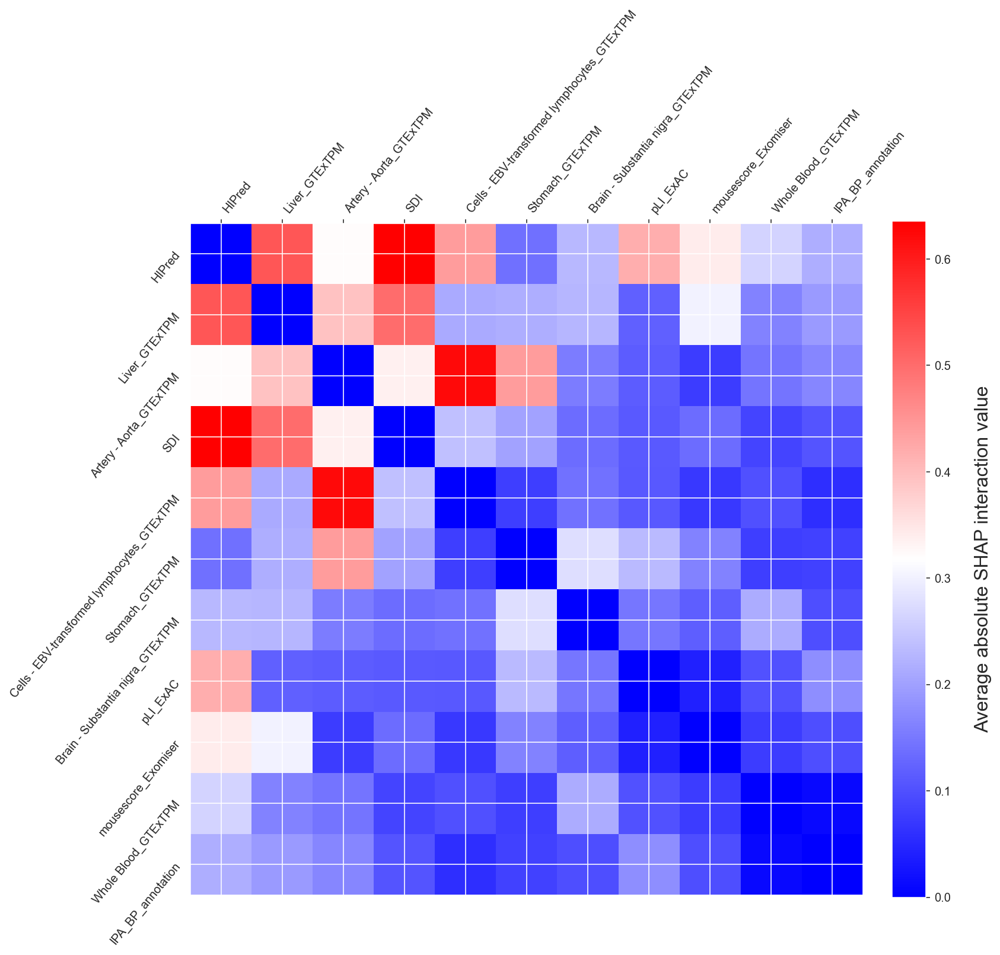

In [31]:
tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
gbar = plt.colorbar(fraction=0.046, pad=0.04)
gbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions.svg", format='svg', dpi=1200)


#plt.show()


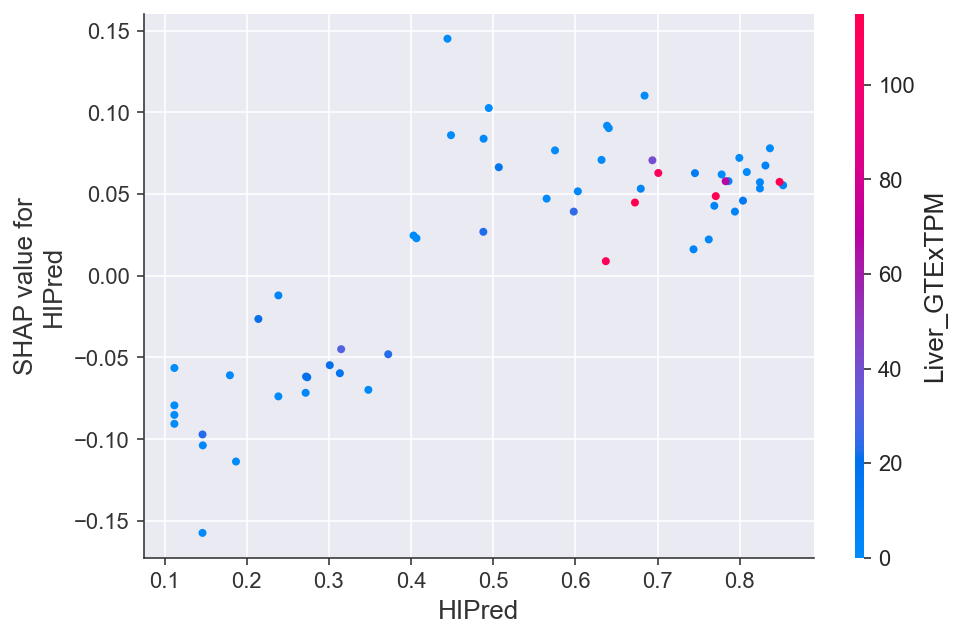

In [34]:
shap.dependence_plot(
    "HIPred", shap_values, X_importance, interaction_index="Liver_GTExTPM"
)

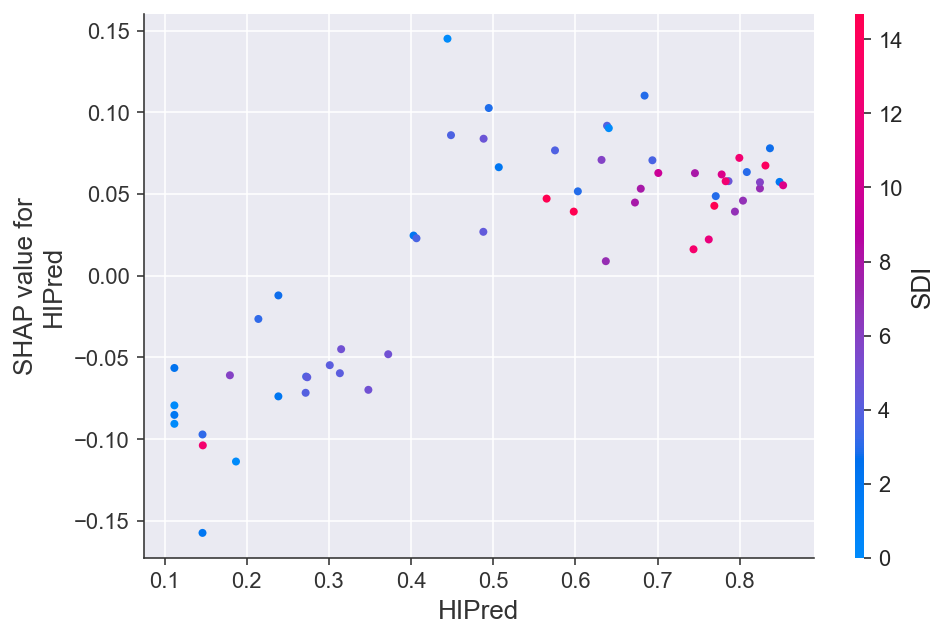

In [35]:
shap.dependence_plot(
    "HIPred", shap_values, X_importance, interaction_index="SDI"
)

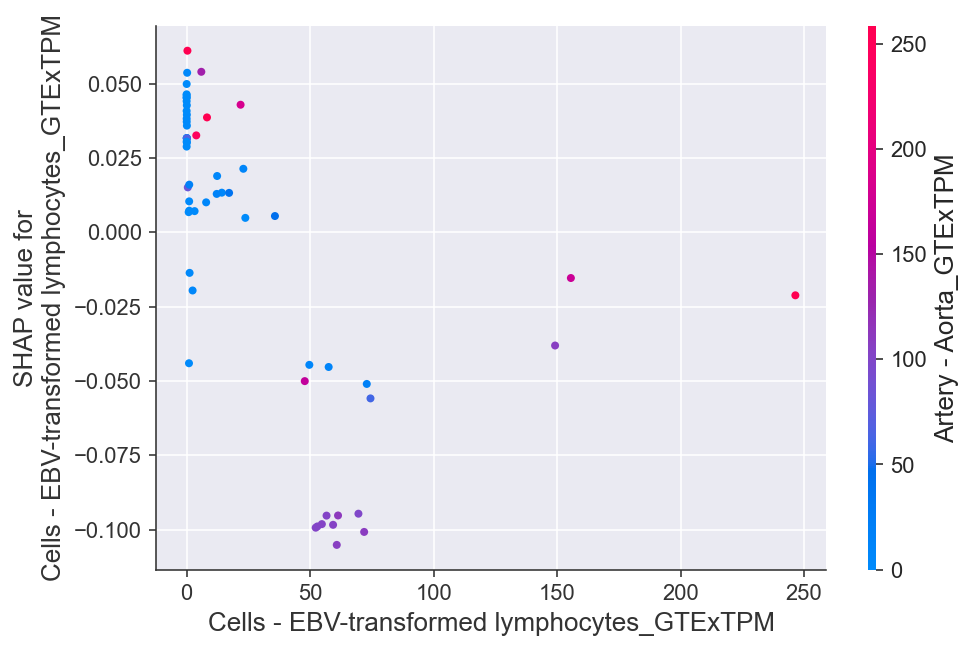

In [38]:
shap.dependence_plot(
    "Cells - EBV-transformed lymphocytes_GTExTPM", shap_values, X_importance, interaction_index="Artery - Aorta_GTExTPM"
)

In [41]:
expected_value = explainer.expected_value

if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(11)
features =X_test.iloc[select]


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: 0.5942307692307692


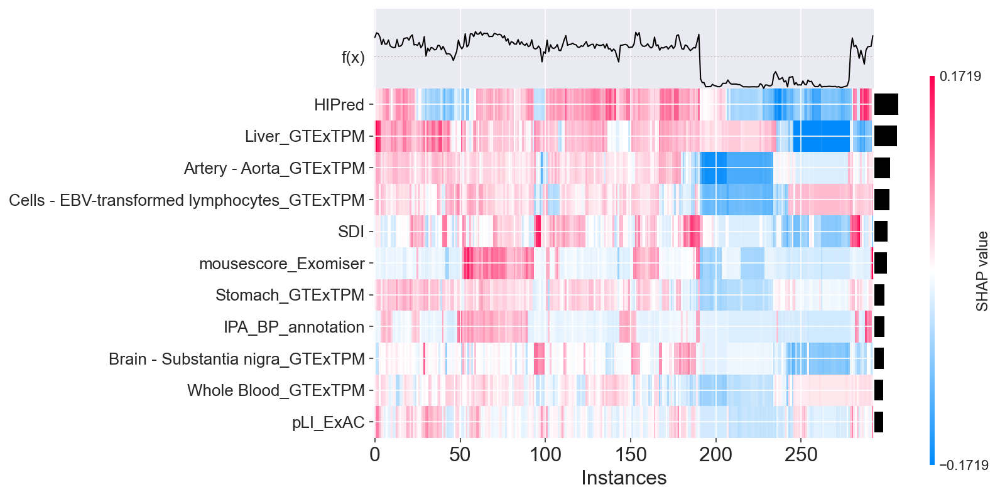

In [43]:
# https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/heatmap.html

shap_values = explainer(X)
fig, ax = plt.subplots()
shap.plots.heatmap(shap_values, max_display=11)
fig.savefig('shap_heatmap.png', format='png', dpi=300, bbox_inches = "tight")

In [44]:
select = range(11)
features = X.iloc[select]
features_display = X.loc[features.index]
shap_values = explainer.shap_values(X)


In [45]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:293, :],
    X.iloc[:293, :],
    features_display,
)

In [46]:
output_of_force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values[:293, :],
    X.iloc[:293, :],
    features_display,
    show=False,
)
file = "force_plot_gb.html"
shap.save_html(file, output_of_force_plot)

### SHAP average measures per gene and per feature:

In [48]:
explainer = shap.Explainer(gb, X)
shap_values2 = explainer.shap_values(X)
features = X.columns.values.tolist()

shapdf = pd.DataFrame(data=np.array(shap_values2), columns=features)
shapdf["shap_average"] = shapdf.mean(axis=1)
shapdf

,Artery - Aorta_GTExTPM,Cells - EBV-transformed lymphocytes_GTExTPM,IPA_BP_annotation,mousescore_Exomiser,SDI,HIPred,Liver_GTExTPM,Brain - Substantia nigra_GTExTPM,Stomach_GTExTPM,Whole Blood_GTExTPM,pLI_ExAC,shap_average
0,0.037385,0.041022,0.050096,0.091813,0.004843,0.038764,0.053809,0.011578,0.034600,0.035128,0.013355,0.037490
1,-0.136669,-0.130390,-0.013650,-0.007430,0.016653,-0.001226,0.039509,-0.009793,-0.066713,-0.061910,-0.032763,-0.036762
2,-0.138502,-0.121422,-0.014325,-0.052180,-0.016425,0.044970,0.008943,-0.012919,-0.062345,-0.051372,-0.034794,-0.040943
3,-0.112891,-0.111416,-0.018438,-0.052633,0.007129,-0.028107,0.012411,-0.009530,-0.047914,-0.033216,-0.037547,-0.039287
4,-0.137373,-0.133717,-0.013687,-0.044376,0.017650,0.004342,0.005171,-0.014675,-0.058072,-0.054212,-0.032379,-0.041939
...,...,...,...,...,...,...,...,...,...,...,...,...
288,0.034240,0.012157,-0.005999,-0.002617,0.055765,0.063511,0.043269,0.002014,0.035477,0.007732,-0.011948,0.021236
289,-0.111632,-0.109483,-0.020369,-0.050856,-0.025572,-0.042889,0.018710,-0.009122,-0.041360,-0.033557,-0.038207,-0.042213
290,0.039315,0.009488,-0.008539,-0.016439,0.061966,0.064002,0.044819,0.010647,0.036457,-0.034771,-0.017603,0.017213
291,-0.111099,-0.111029,-0.020369,-0.049685,-0.025988,-0.044154,0.018577,-0.008697,-0.043547,-0.030821,-0.035514,-0.042030


In [49]:
df_d = pd.concat([df_c, shapdf], axis=1)
df_d.to_csv("training_features_shapavg.csv", index=False)
df_d

,Gene,cat_Score,BPlabel_encoded,Artery - Aorta_GTExTPM,Cells - EBV-transformed lymphocytes_GTExTPM,IPA_BP_annotation,mousescore_Exomiser,SDI,HIPred,Liver_GTExTPM,Brain - Substantia nigra_GTExTPM,Stomach_GTExTPM,Whole Blood_GTExTPM,pLI_ExAC,shap_average
0,ABCC9,0.972267,1.00,0.037385,0.041022,0.050096,0.091813,0.004843,0.038764,0.053809,0.011578,0.034600,0.035128,0.013355,0.037490
1,AC006455.1,0.155489,0.10,-0.136669,-0.130390,-0.013650,-0.007430,0.016653,-0.001226,0.039509,-0.009793,-0.066713,-0.061910,-0.032763,-0.036762
2,AC007216.2,0.109502,0.10,-0.138502,-0.121422,-0.014325,-0.052180,-0.016425,0.044970,0.008943,-0.012919,-0.062345,-0.051372,-0.034794,-0.040943
3,AC007461.1,0.127721,0.10,-0.112891,-0.111416,-0.018438,-0.052633,0.007129,-0.028107,0.012411,-0.009530,-0.047914,-0.033216,-0.037547,-0.039287
4,AC008498.1,0.098545,0.10,-0.137373,-0.133717,-0.013687,-0.044376,0.017650,0.004342,0.005171,-0.014675,-0.058072,-0.054212,-0.032379,-0.041939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,YES1,0.793474,0.75,0.034240,0.012157,-0.005999,-0.002617,0.055765,0.063511,0.043269,0.002014,0.035477,0.007732,-0.011948,0.021236
289,Z98049.1,0.095535,0.10,-0.111632,-0.109483,-0.020369,-0.050856,-0.025572,-0.042889,0.018710,-0.009122,-0.041360,-0.033557,-0.038207,-0.042213
290,ZAP70,0.749216,0.75,0.039315,0.009488,-0.008539,-0.016439,0.061966,0.064002,0.044819,0.010647,0.036457,-0.034771,-0.017603,0.017213
291,ZMYM6NB,0.097546,0.10,-0.111099,-0.111029,-0.020369,-0.049685,-0.025988,-0.044154,0.018577,-0.008697,-0.043547,-0.030821,-0.035514,-0.042030


In [50]:
df_e = df_d[["Gene", "GB_Score", "shap_average", "BPlabel_encoded"]]
df_e.to_csv("training_genes_shapavg.csv", index=False)
df_e

KeyError: "['GB_Score'] not in index"

## Decision Plots:
- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. _This is usually different than the importance ordering for the entire dataset._ In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
- At the bottom of the plot, the observations converge at explainer.expected_value.

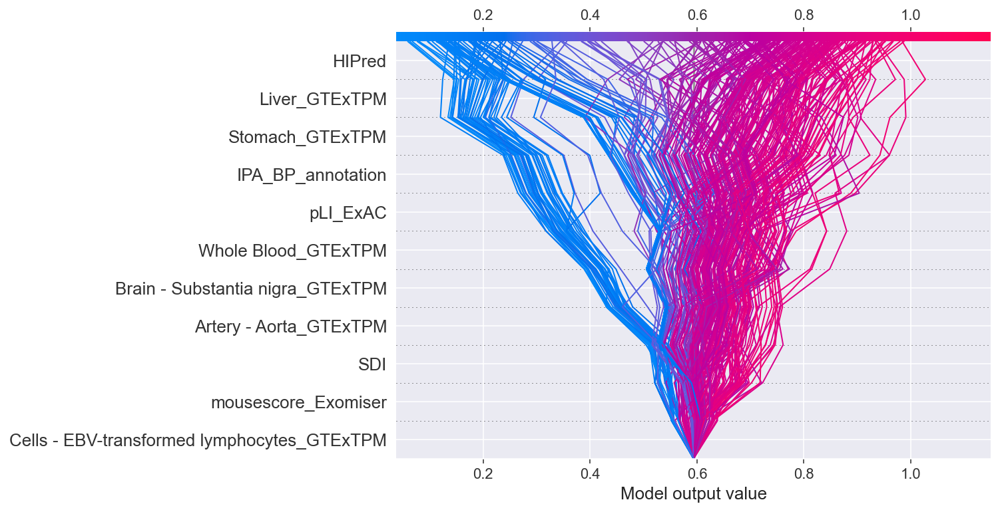

In [40]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X),
    features_display,
    ignore_warnings=True,
)

In [45]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [46]:
y_pred = gb.predict(X)

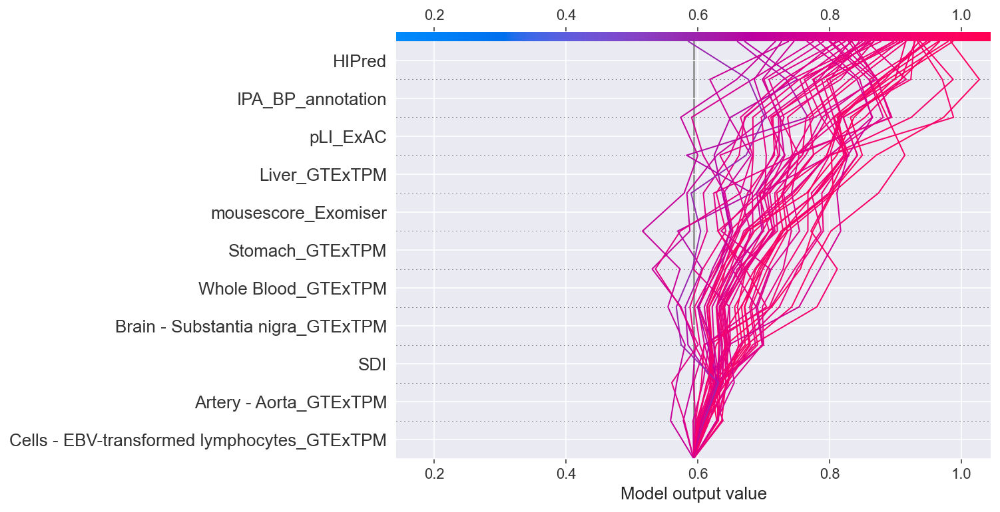

In [48]:
T = X
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

fig, ax = plt.subplots()
shap.decision_plot(expected_value, sh, T, return_objects=True)
fig.savefig('shap_51genes.png', format='png', dpi=300, bbox_inches = "tight")


In [159]:
y_pred = cat.predict(X)
T = X[(y_pred <= 0.6)]
T = T[(Y == 1)]
T.shape

(1, 8)

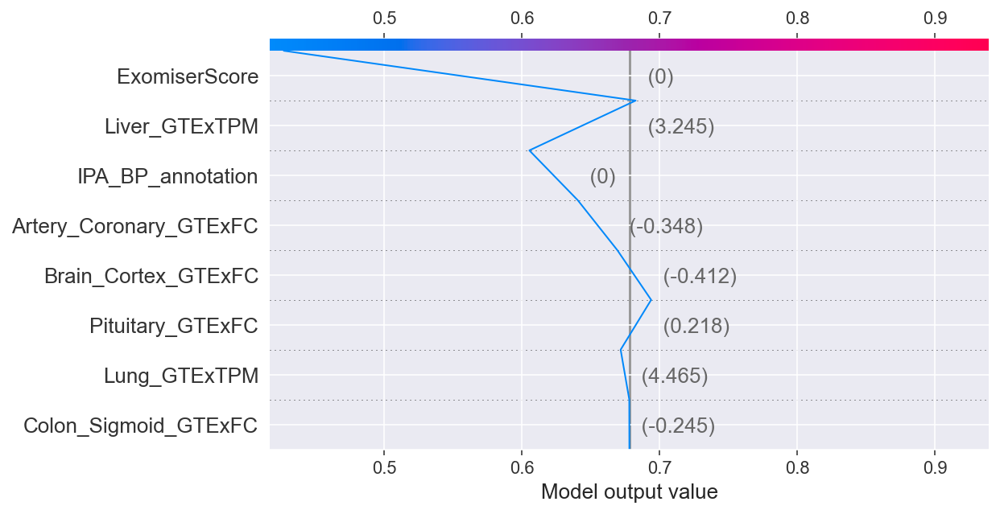

In [160]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [161]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


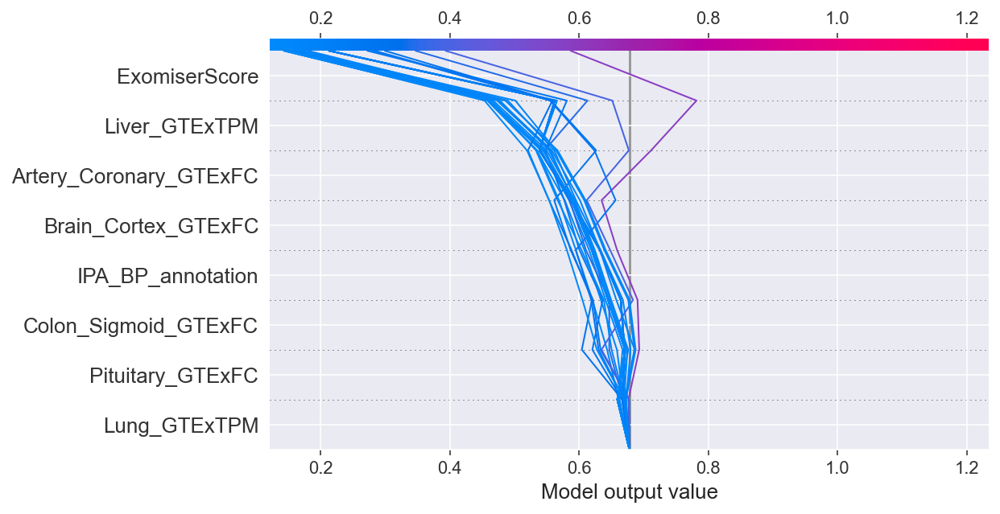

In [162]:
y_pred = cat.predict(X)
T = X
T = T[(Y == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

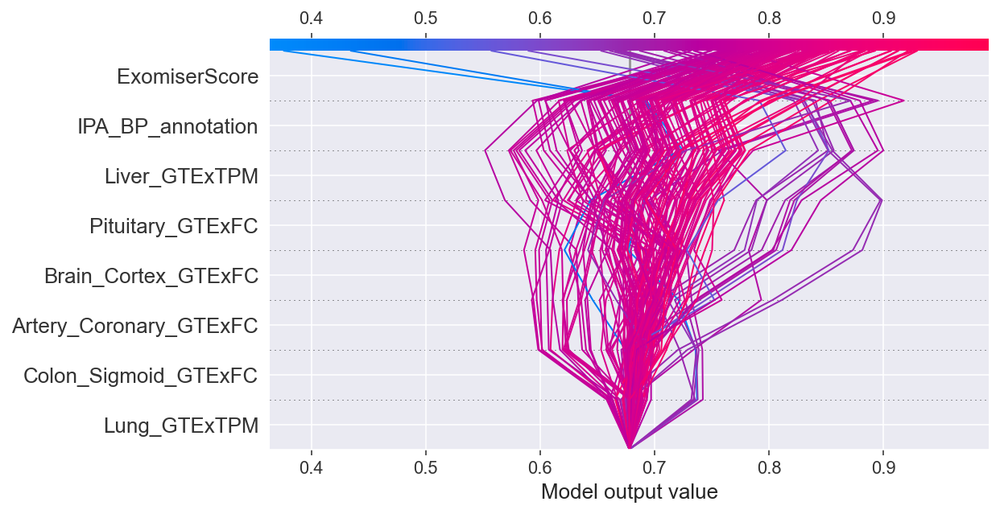

In [163]:
y_pred = cat.predict(X)
T = X
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

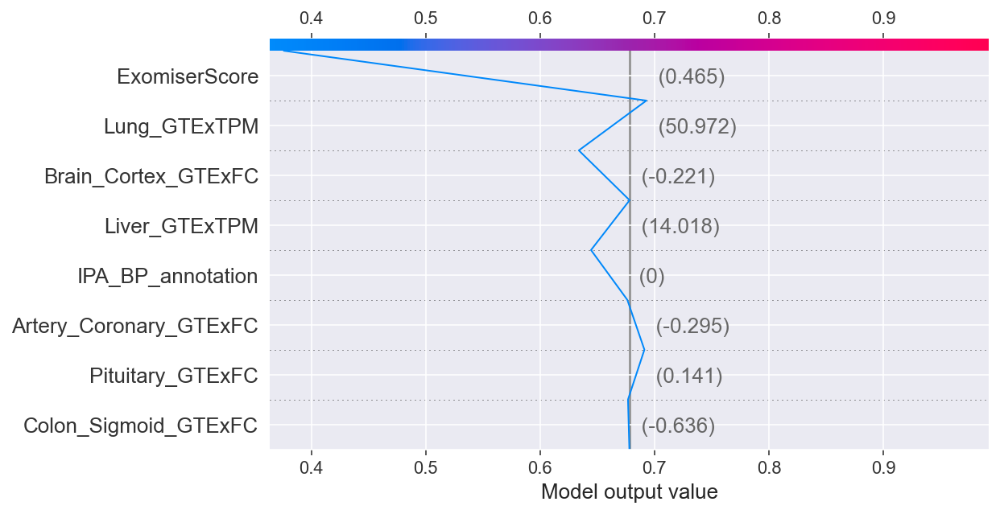

In [164]:
T = X[(y_pred <= 0.4)]
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

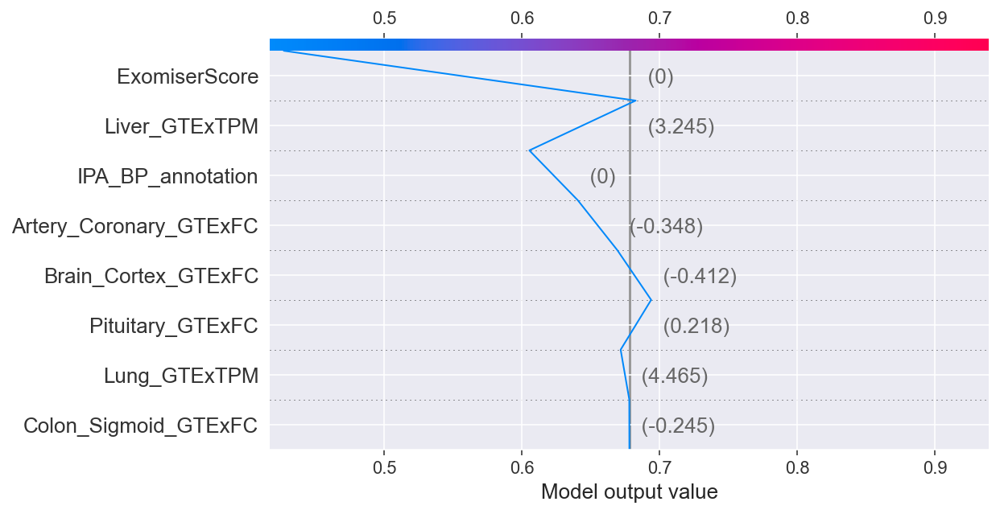

In [165]:
T = X[(y_pred <= 0.5)]
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [166]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


In [167]:
X = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]
df_gene = data[["Gene"]]

X = pd.concat([df_gene, X], axis=1)

X = X.set_index("Gene")

X.iloc[65]

Pituitary_GTExFC            -0.402815
Lung_GTExTPM              1325.710000
Liver_GTExTPM              422.046000
IPA_BP_annotation            1.000000
ExomiserScore                0.913255
Brain_Cortex_GTExFC         -3.749093
Artery_Coronary_GTExFC       0.529133
Colon_Sigmoid_GTExFC         0.671661
Name: DUSP1, dtype: float64

In [168]:
X.iloc[[90], :]

,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC
Gene,,,,,,,,
HFE,0.218075,4.46479,3.24452,0,0.0,-0.412119,-0.347885,-0.244719


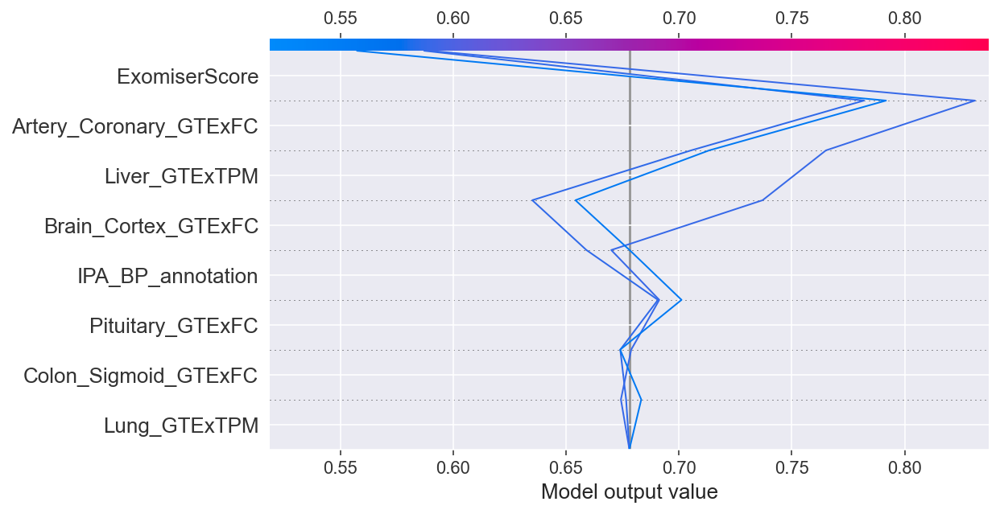

In [169]:
y_pred = cat.predict(X)

T = X[(y_pred >= 0.5) & (y_pred <= 0.6)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [170]:
predictions = list(cat.predict(X))

output = pd.Series(data=predictions, index=X.index, name="cat_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

,Gene,xgb_Score,BPlabel_encoded
0,ABCC9,0.914859,1.00
1,AC020983.5,0.126907,0.10
2,AC093677.1,0.186767,0.10
3,AC097374.4,0.186767,0.10
4,AC103563.2,0.116612,0.10
...,...,...,...
238,VAMP2,0.761147,0.75
239,VDR,0.777577,0.75
240,VEGFA,0.869549,1.00
241,YES1,0.787287,0.75


In [171]:
bdnf = df_c.iloc[22]
bdnf

Gene                   BDNF
xgb_Score          0.697754
BPlabel_encoded        0.75
Name: 22, dtype: object

In [172]:
list(X.index).index("BDNF")

22

In [188]:

def shap_plot(j):
    explainerModel = shap.TreeExplainer(cat)
    shap_values_Model = explainerModel.shap_values(X)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X.iloc[[j]],
        feature_names=X.columns
    )
    return p


#fig, ax = plt.subplots()
shap_plot(22)
#fig.savefig('bdnf_force.png', format='png', dpi=300, bbox_inches = "tight")

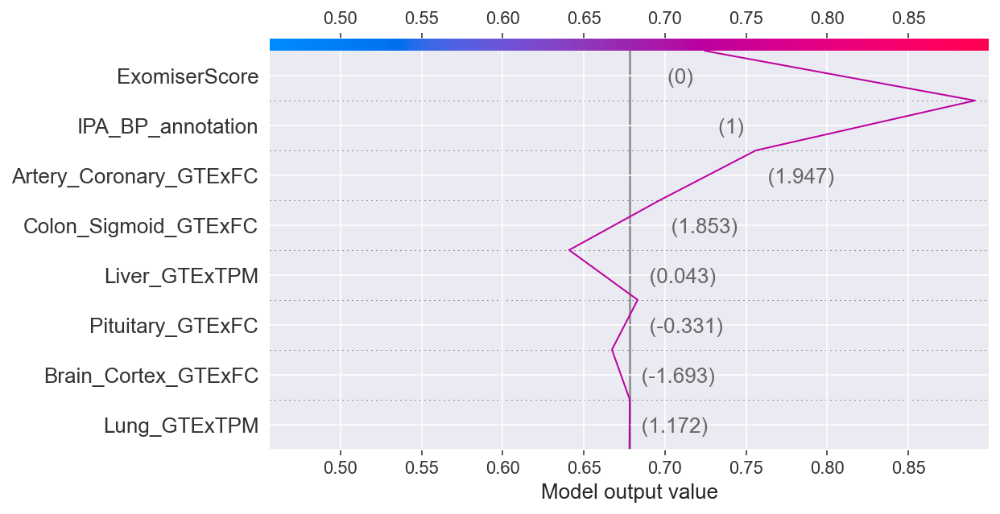

In [60]:
#BDNF
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[[22]]),
    X.iloc[22],
    list(features_display,),
    return_objects=True
)

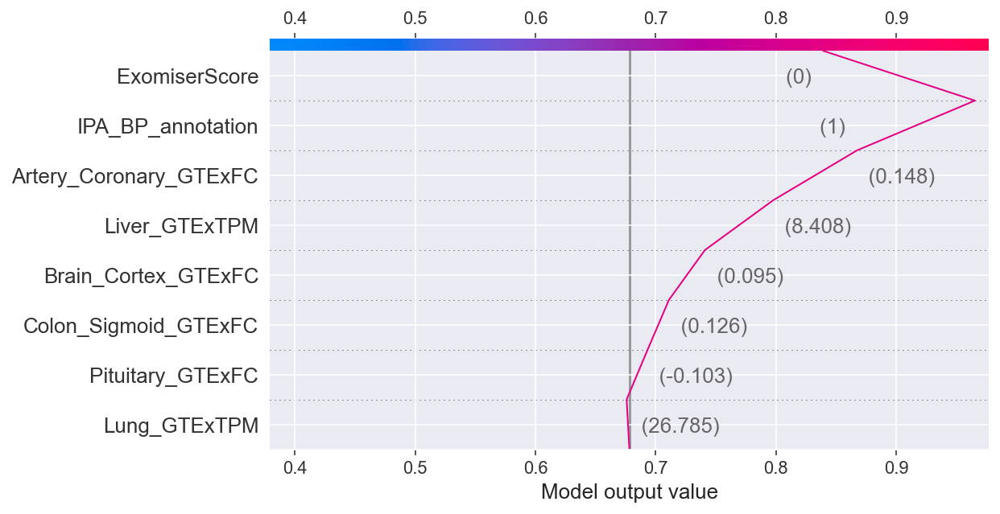

In [61]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[[41]]),
    X.iloc[41],
    list(features_display),
)
#CLCN6

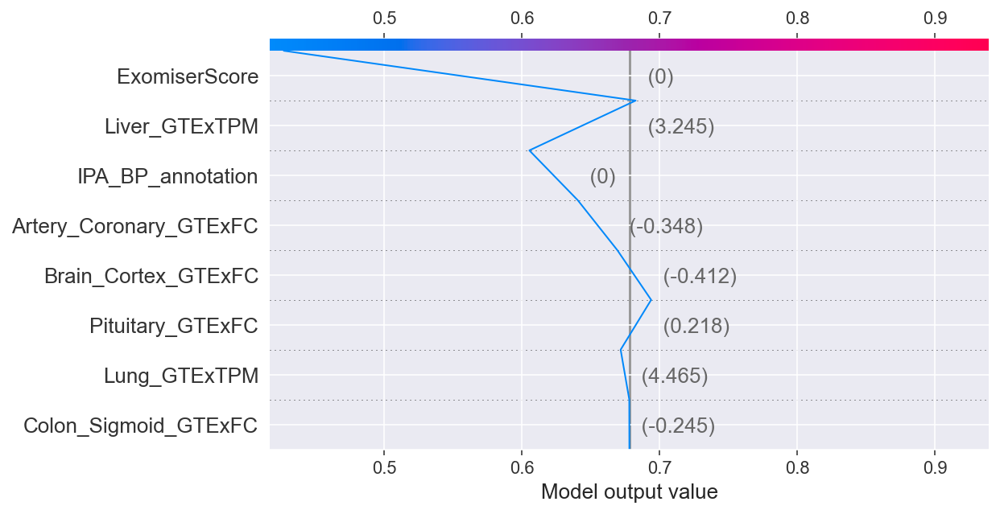

In [62]:
#HFE
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[[90]]),
    X.iloc[90],
    list(features_display),
)

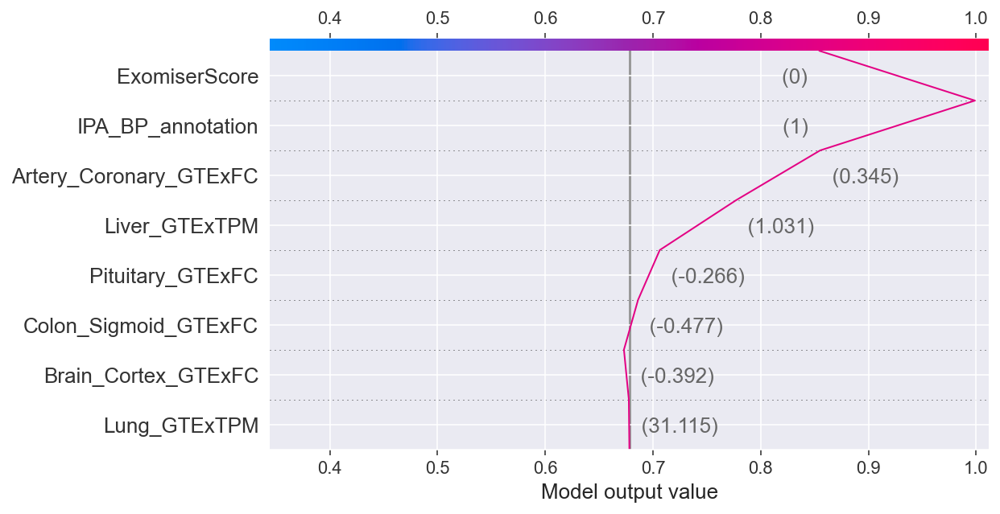

In [63]:
#EDNRA
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[[68]]),
    X.iloc[68],
    list(features_display),
)

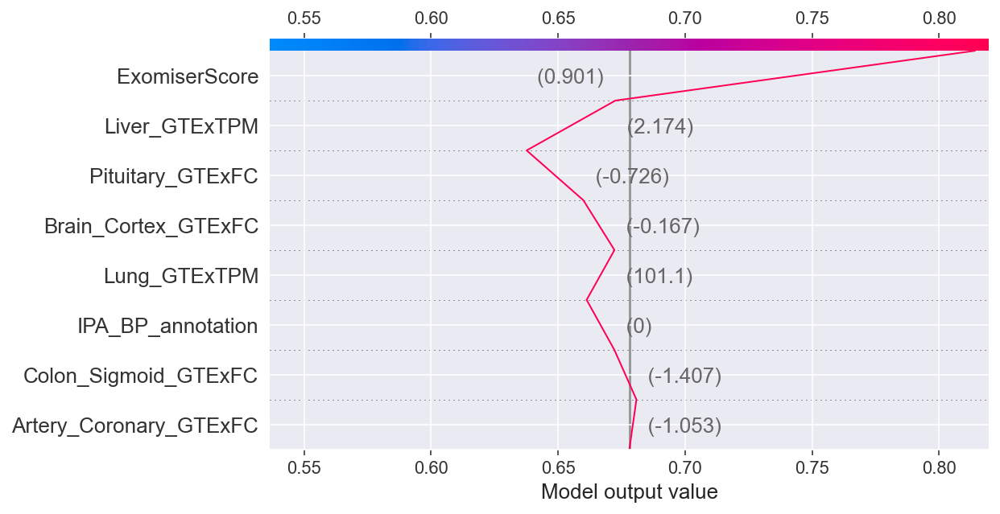

In [64]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[83]),
    X.iloc[83],
    list(features_display),
)

## Decison Plots of Genes with no exomiser score

In [65]:
XY = X
XY = XY.reset_index()
Y2 = Y.to_frame()
XY["Training_Score"] = Y2["BPlabel_encoded"]
lowEx = XY.loc[XY["ExomiserScore"] == 0]
lowEx

,Gene,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,Training_Score
5,ACBD4,0.155903,14.709300,41.588600,0,0.0,0.169534,0.329856,0.088092,1.00
7,ACTG1P3,-0.218870,2.541570,0.983033,0,0.0,-0.464271,0.824622,-0.815827,0.10
22,BDNF,-0.331336,1.171760,0.043415,1,0.0,-1.693179,1.946759,1.852603,0.75
23,BTF3L4P2,-0.668931,0.480531,0.145694,0,0.0,-0.509887,1.535745,-0.184580,0.10
38,CHCHD3P2,0.526333,0.000000,0.000000,0,0.0,-0.531806,-0.491752,-2.680114,0.10
40,CKS1BP5,0.447898,0.000000,0.000000,0,0.0,-1.133441,-0.780194,-2.337793,0.10
41,CLCN6,-0.103133,26.785400,8.408100,1,0.0,0.095092,0.148308,0.125877,1.00
47,CTB-167G5.3,0.445601,0.000000,0.000000,0,0.0,-1.059549,-0.929356,-2.337793,0.10
53,CYCSP4,-0.319752,0.000000,0.000000,0,0.0,-1.123830,-0.699691,-2.338829,0.10
66,DUTP3,0.477567,0.000000,0.000000,0,0.0,-1.052680,-0.727359,-2.465080,0.10


In [66]:
Y2 = lowEx["Training_Score"]
lowEx = lowEx.drop(["Training_Score", "Gene"], 1)

In [67]:
y_pred = cat.predict(lowEx)

In [68]:
explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(lowEx)
expected_value = explainer.expected_value

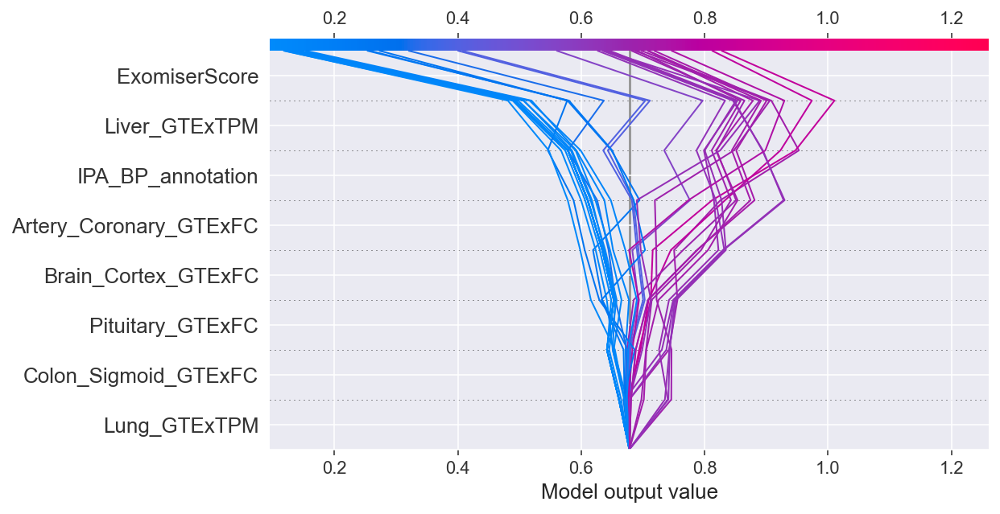

In [69]:
T = lowEx


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

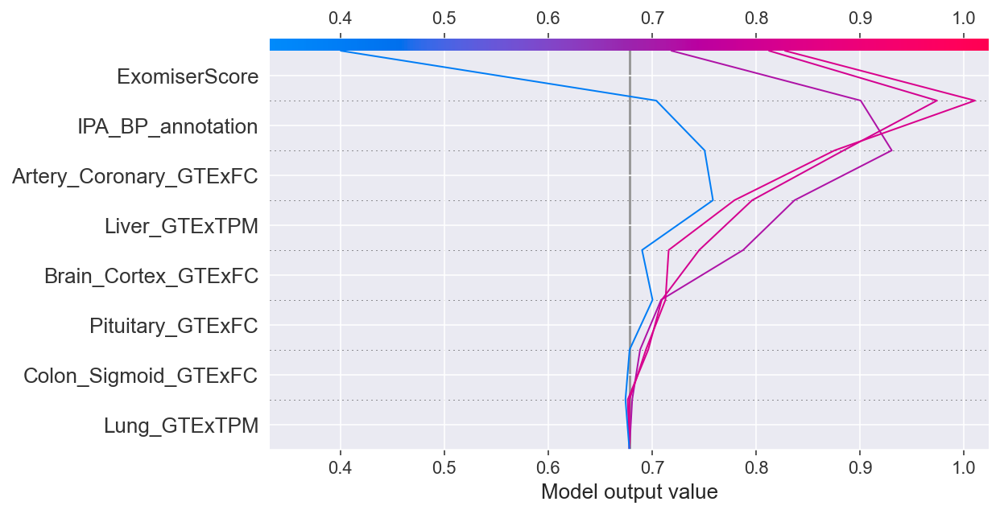

In [70]:
T = lowEx
T = T[(Y2 == 1.0)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

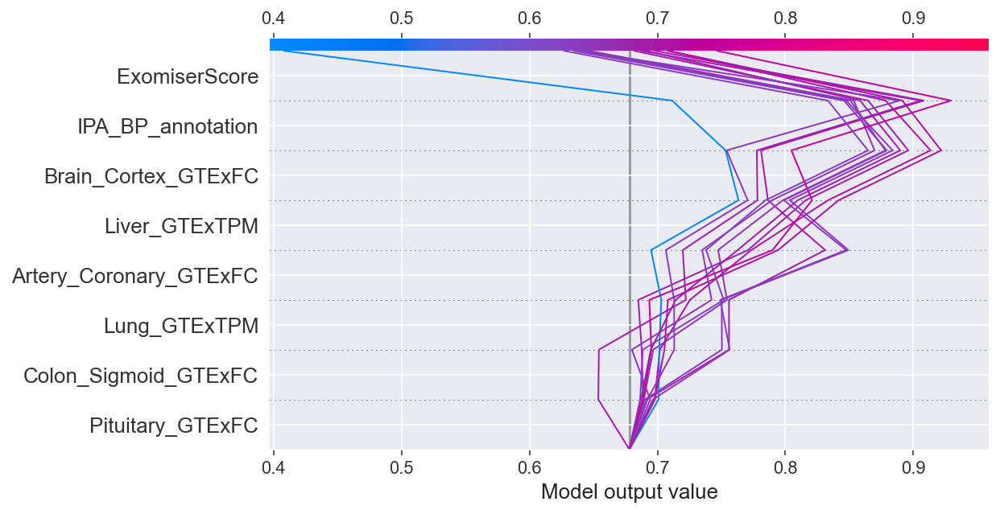

In [71]:
T = lowEx
T = T[(Y2 == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

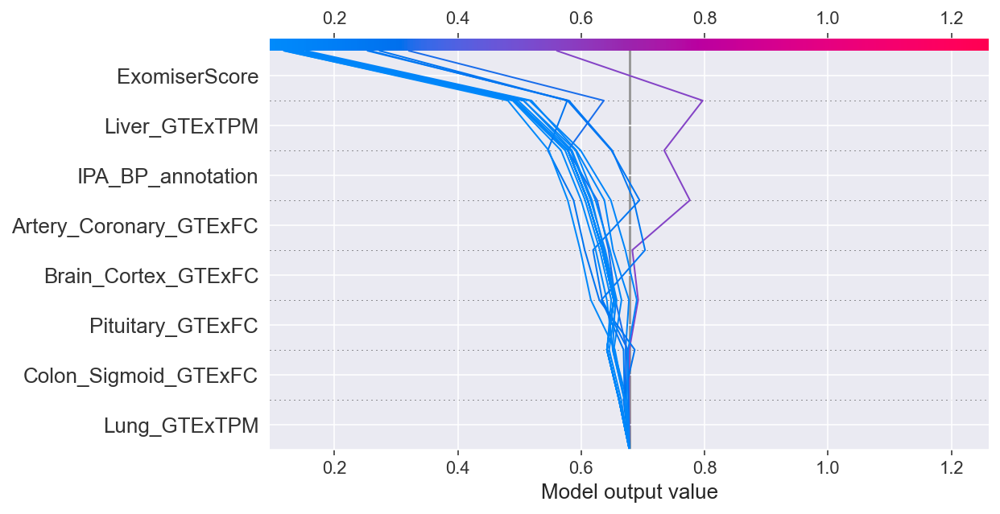

In [72]:
T = lowEx
T = T[(Y2 == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

## Unknown Gene Prediction

In [73]:
dataset_unknown = pd.read_csv("2021-07-18_pval07_BP_unknown.txt", sep="\t")

df2 = dataset_unknown[
    [
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",
    ]
]

df2.shape

(1804, 8)

In [74]:
imputer = MissForest(random_state=seed)
df3 = imputer.fit_transform(df2)

Iteration: 0
Iteration: 1
Iteration: 2


In [75]:
X2 = pd.DataFrame(df3, index=df2.index, columns=df2.columns)

X2.shape

(1804, 8)

In [76]:
model = cat
model.fit(X, Y)
predictions = list(model.predict(X2))

output = pd.Series(data=predictions, index=dataset_unknown.index, name="cat_Score")

df_total = pd.concat([dataset_unknown, output], axis=1)

In [77]:
df_total.nlargest(10, "cat_Score", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,minP.min.min,minP.min.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,...,GTEx_signif_sexbias,HIPred,IPA_BP_annotation,IPA_Activity,O_GlcNAc_Score,EMS_Max,PharmGKB_Score,ExAc_constraint_obs_exp,BPlabel,xgb_Score
1714,VCL,NaN,NaN,NaN,NaN,NaN,NaN,525,-0.4716,12.000000,...,NaN,0.639468,1,2,NaN,NaN,NaN,0.304247,unknown,0.925563
561,GCH1,NaN,NaN,NaN,NaN,NaN,NaN,496,-0.3323,15.698970,...,NaN,0.824708,1,2,NaN,NaN,NaN,NaN,unknown,0.911683
459,EIF2AK4,0.088,0.430,0.0,NaN,NaN,NaN,859,0.4011,49.698970,...,1.0,0.708683,1,0,NaN,NaN,0.0,0.920901,unknown,0.909966
476,ERAP1,0.243,0.539,0.0,NaN,NaN,NaN,60,-0.3677,375.000000,...,NaN,0.167413,1,2,0.256505,NaN,NaN,NaN,unknown,0.908386
201,C1GALT1,NaN,NaN,NaN,NaN,NaN,NaN,45,-0.3187,28.000000,...,1.0,0.451622,1,2,NaN,NaN,NaN,NaN,unknown,0.907541
828,MLLT3,NaN,NaN,NaN,NaN,NaN,NaN,156,0.5430,12.698970,...,1.0,0.824708,1,0,NaN,NaN,0.0,0.168365,unknown,0.906908
1607,TLN1,NaN,NaN,NaN,NaN,NaN,NaN,945,-0.5041,21.301030,...,1.0,0.801729,1,2,14.477714,NaN,NaN,0.460352,unknown,0.903387
175,BMPR1B,NaN,NaN,NaN,NaN,NaN,NaN,467,0.3888,12.000000,...,NaN,0.852899,1,0,NaN,NaN,NaN,1.020019,unknown,0.902245
611,HDAC9,NaN,NaN,NaN,NaN,NaN,NaN,46,-0.2720,282.522879,...,1.0,0.602501,1,1,NaN,NaN,NaN,NaN,unknown,0.900501
678,INSR,NaN,NaN,NaN,NaN,NaN,NaN,233,0.4183,58.000000,...,1.0,0.743839,1,0,6.200085,NaN,0.0,NaN,unknown,0.900069


In [78]:
df_file = df_total[["Gene", "cat_Score"]]
df_file = df_file.nlargest(1804, "cat_Score", keep="last")

### Model Prediction Distribution:

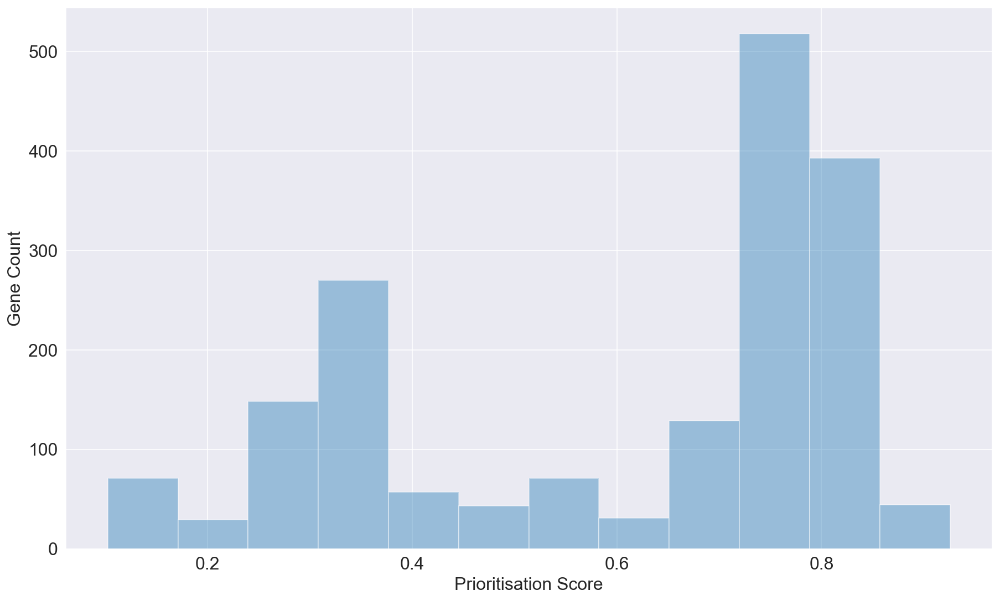

In [79]:
ax = sns.distplot(df_total["cat_Score"], kde=False, norm_hist=False)
ax.set_xlabel("Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

### SHAP Feature Importance Visualization:

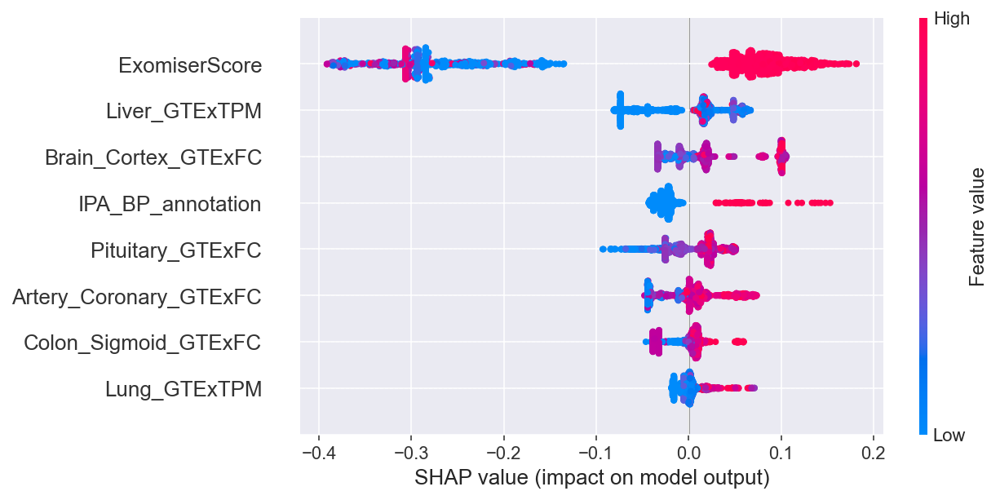

In [80]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [81]:
expected_value = explainer.expected_value

In [82]:
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:1804, :],
    X2.iloc[:1804, :],
    features_display,
)

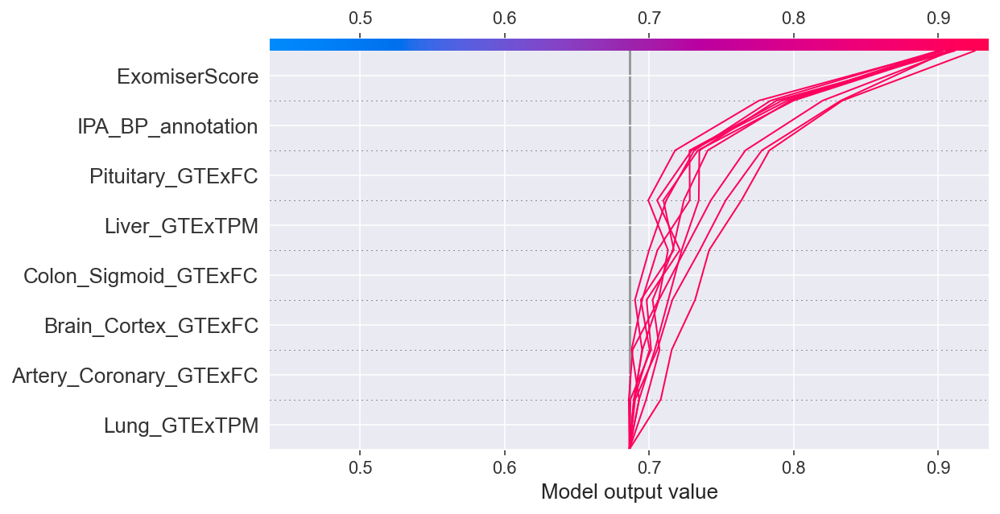

In [83]:
y_pred = model.predict(X2)

T = X2[(y_pred >= 0.900069)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [84]:
L=[1714, 561, 459, 476, 201, 828, 1607, 175, 611, 678]
X10 = X2.loc[L]

In [85]:
df10 = df_total.nlargest(10, "cat_Score", keep="last")
df10 = df10 [[
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",]]

In [86]:
select = range(8)
features = X10.iloc[select]
features_display = X10.loc[features.index]
shap_values = explainer.shap_values(X10)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:10, :],
    X10.iloc[:10, :],
    features_display,
)

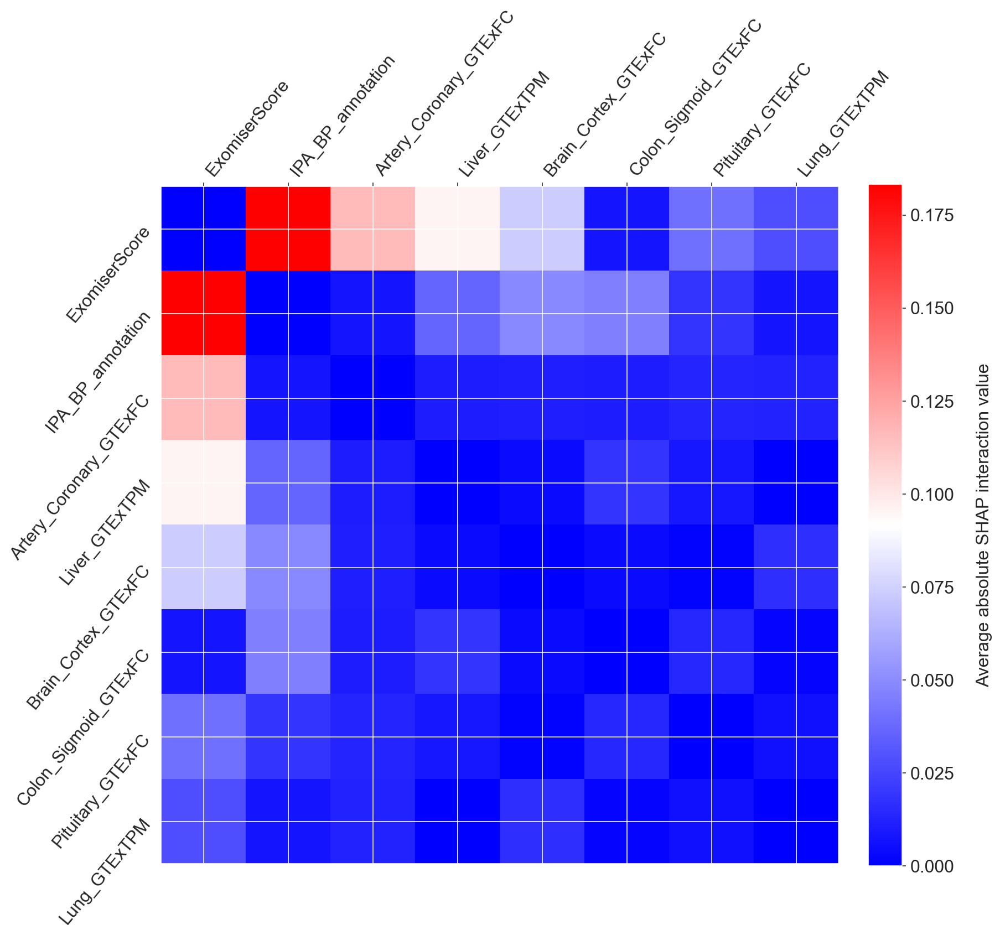

In [87]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X10)
X_interaction10 = pd.DataFrame(data=X10, columns=df10.columns)


tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]
plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
gbar = plt.colorbar(fraction=0.046, pad=0.04)
gbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.show()

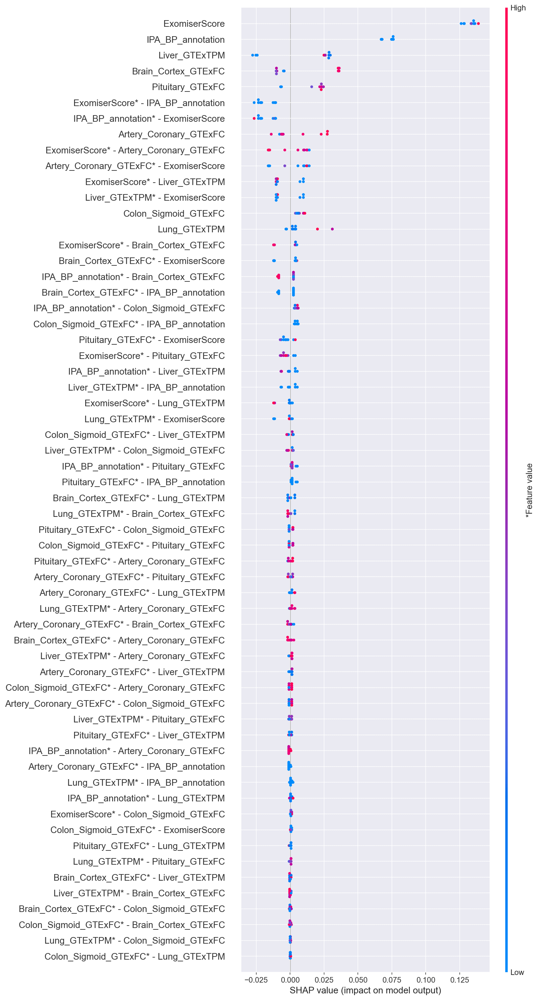

In [88]:
shap.summary_plot(
    shap_interaction_values, X10, max_display=60, plot_type="compact_dot"
)

In [89]:
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1714)

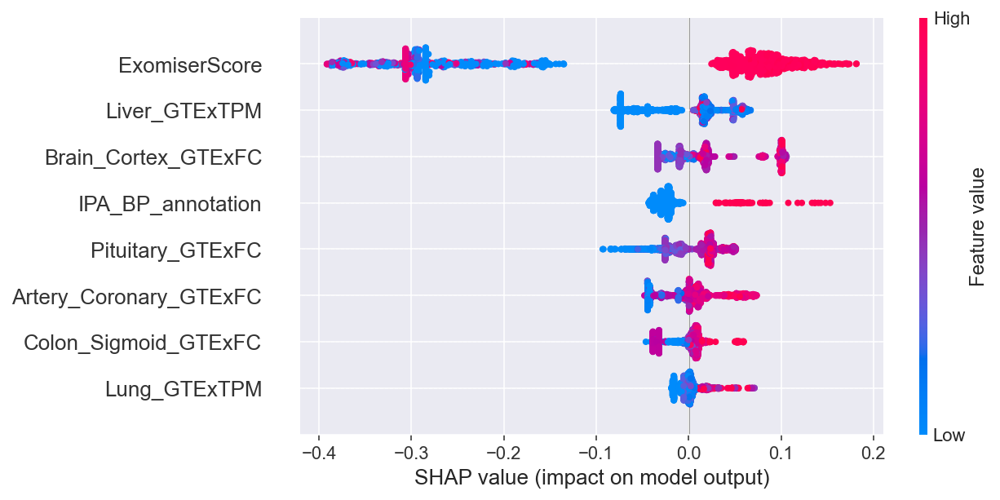

In [90]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [91]:
expected_value = explainer.expected_value

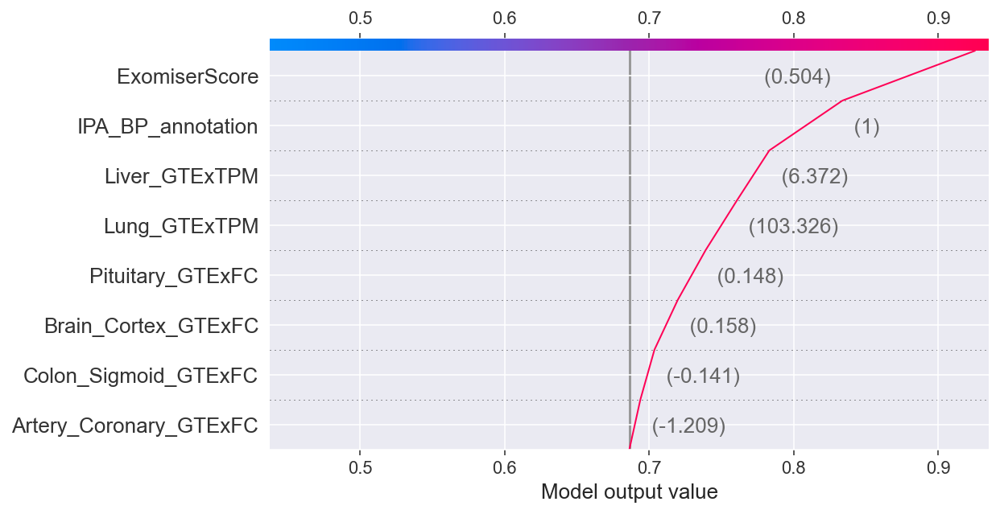

In [92]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1714], X2.iloc[1714])

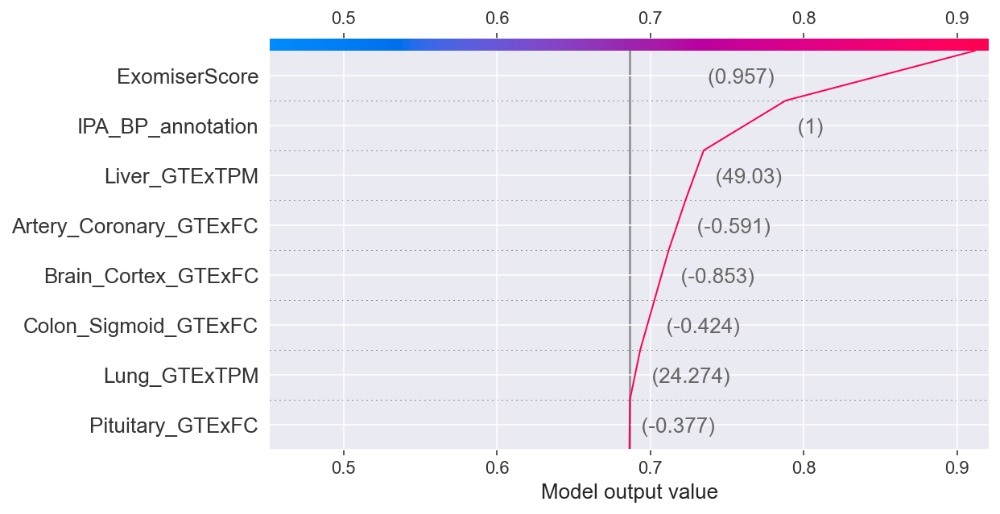

In [93]:
shap.decision_plot(expected_value, shap_values[561], X2.iloc[561])

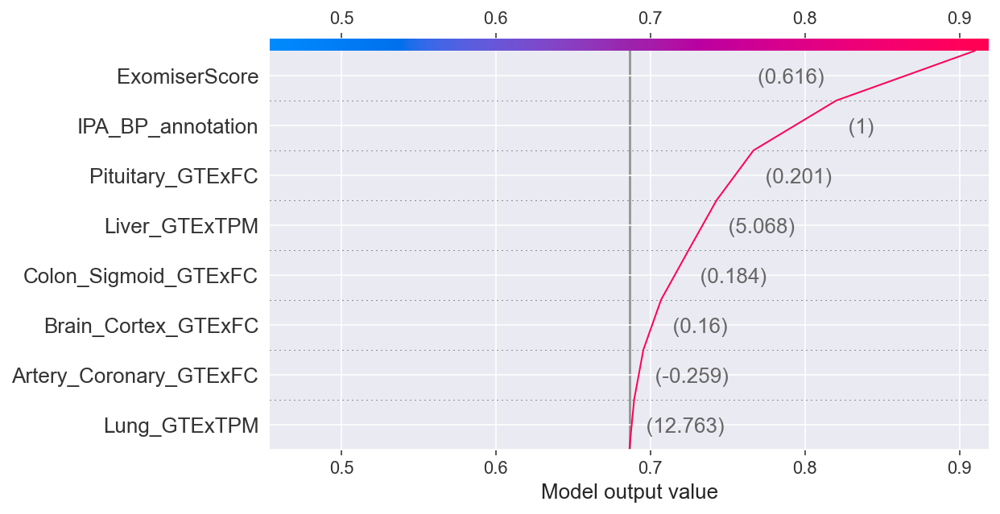

In [94]:
shap.decision_plot(expected_value, shap_values[459], X2.iloc[459])

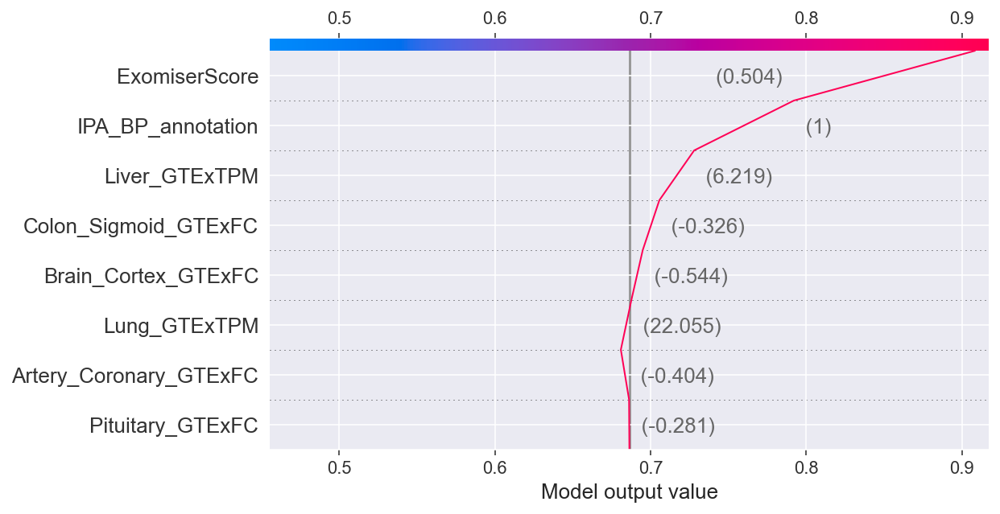

In [95]:
shap.decision_plot(expected_value, shap_values[476], X2.iloc[476])

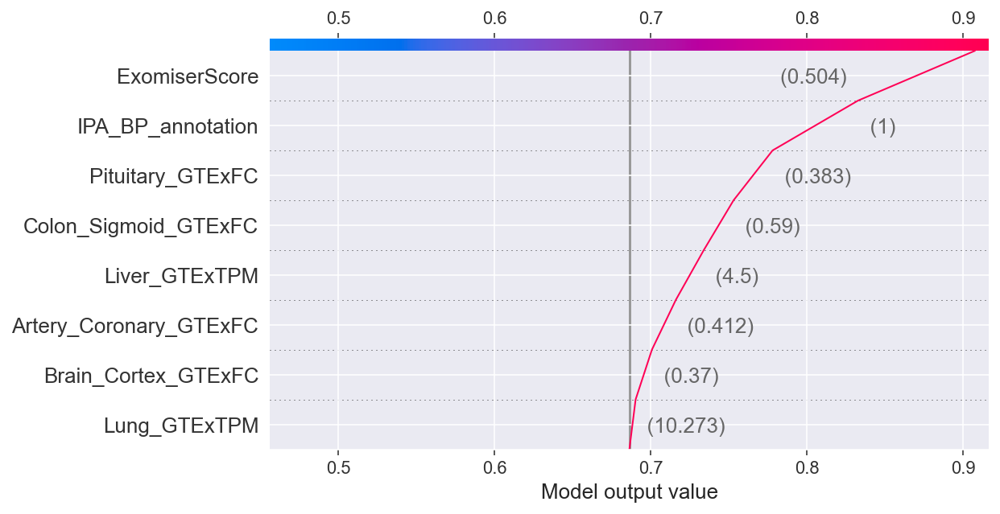

In [96]:
shap.decision_plot(expected_value, shap_values[201], X2.iloc[201])

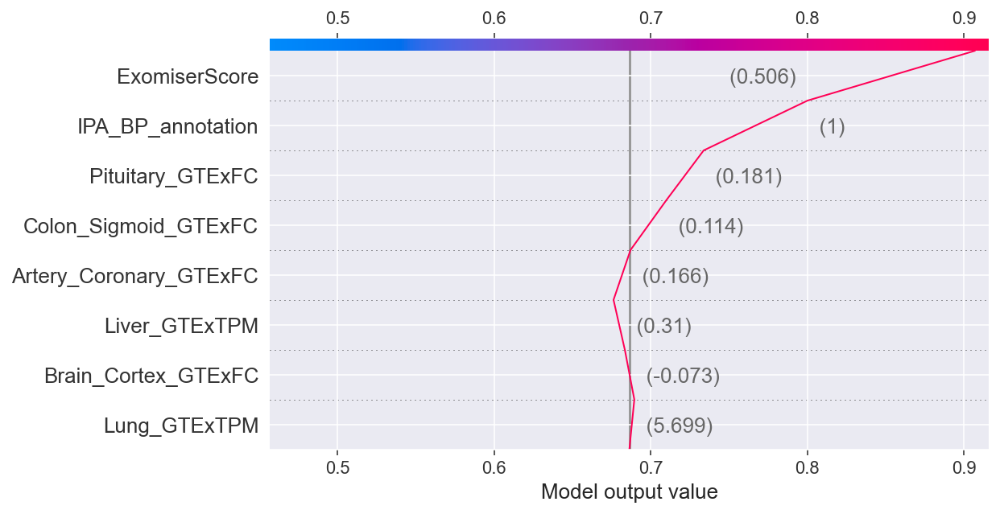

In [97]:
shap.decision_plot(expected_value, shap_values[828], X2.iloc[828])

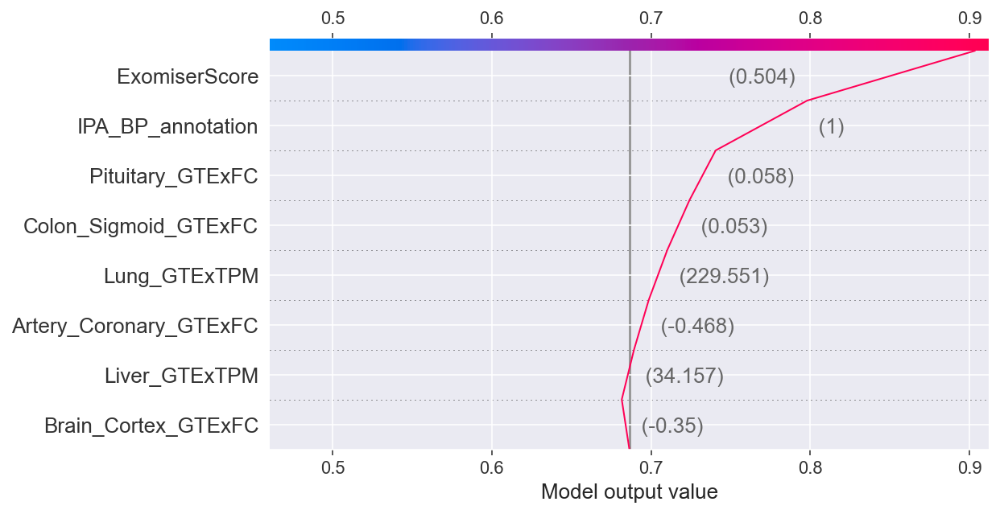

In [98]:
shap.decision_plot(expected_value, shap_values[1607], X2.iloc[1607])

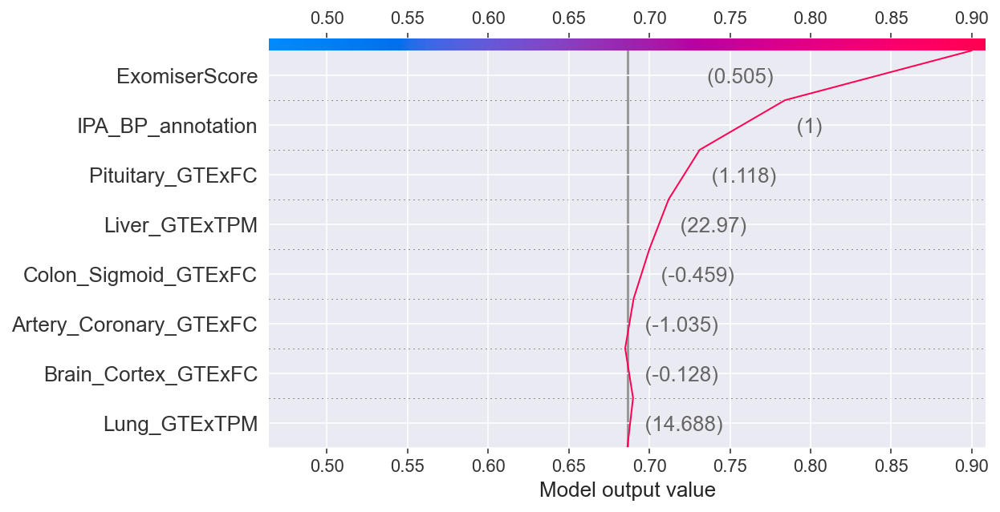

In [99]:
shap.decision_plot(expected_value, shap_values[678], X2.iloc[678])

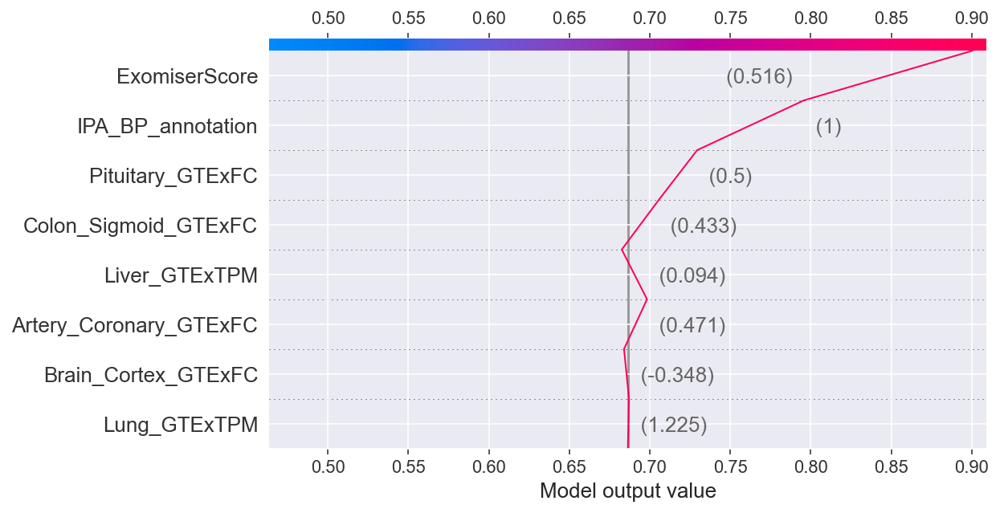

In [100]:
shap.decision_plot(expected_value, shap_values[611], X2.iloc[611])

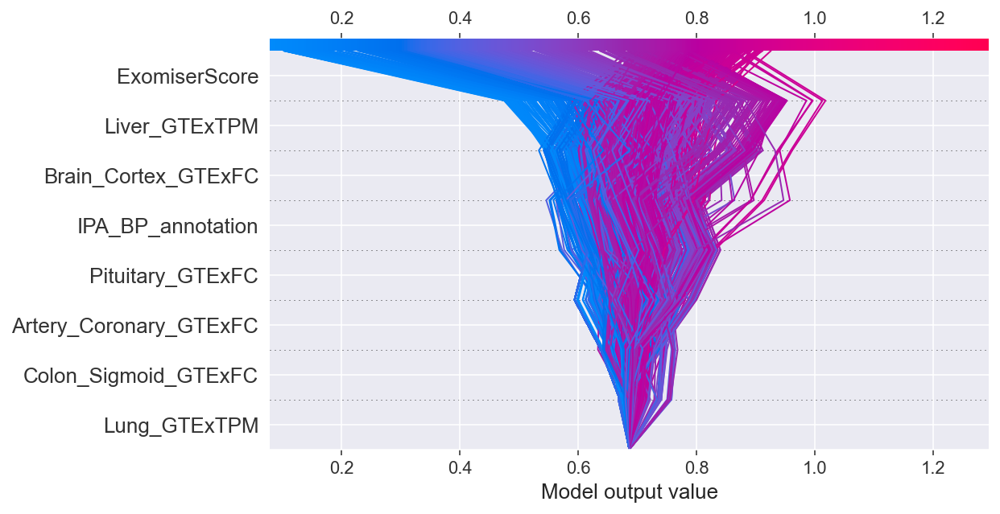

In [101]:
shap.decision_plot(expected_value, shap_values, X2)

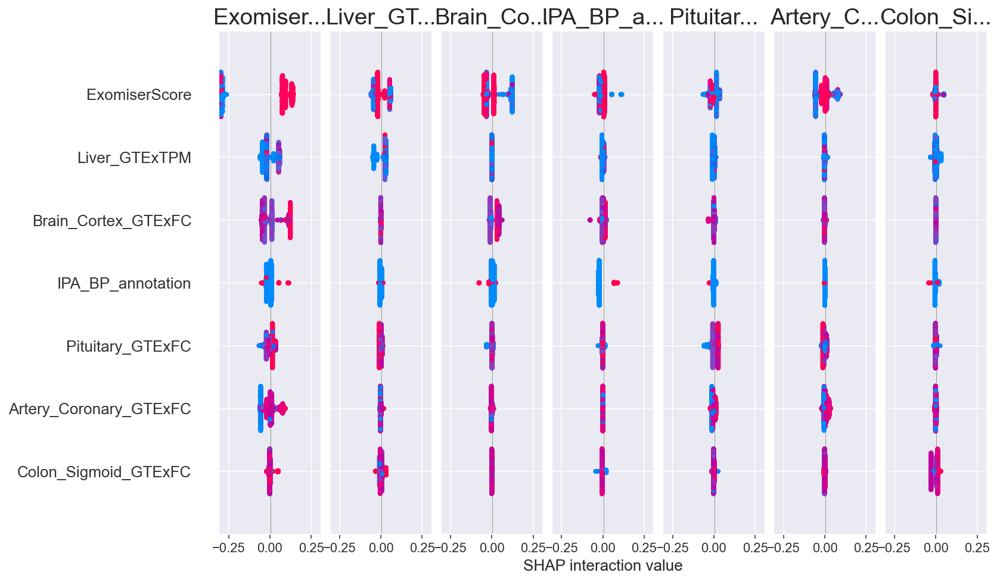

In [102]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X2)
X_interaction2 = pd.DataFrame(data=X2, columns=df2.columns)
shap.summary_plot(shap_interaction_values, X_interaction2)

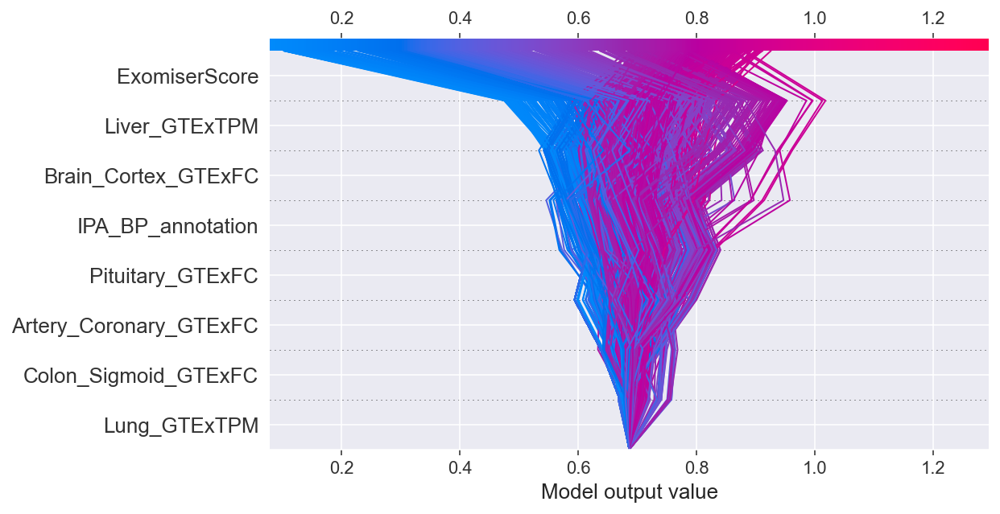

In [103]:
shap.decision_plot(expected_value, shap_values, features_display, ignore_warnings=True)

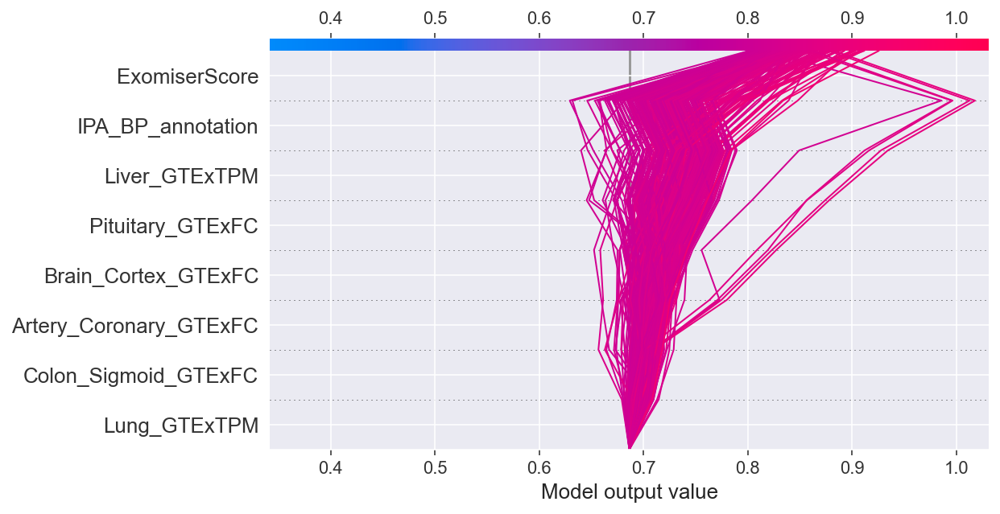

In [104]:
y_pred = cat.predict(X2)
T = X2[(y_pred >= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

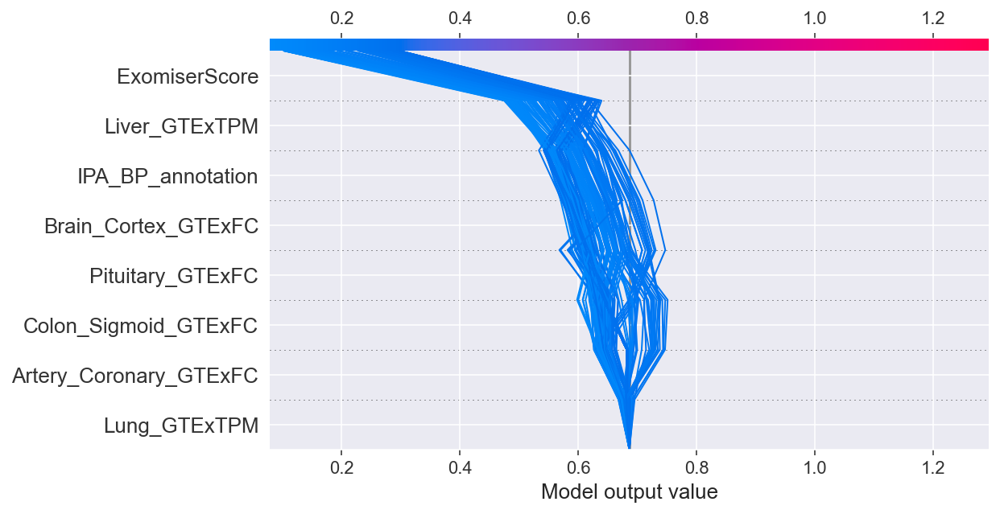

In [105]:
y_pred = cat.predict(X2)
T = X2[(y_pred <= 0.3)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True, ignore_warnings=True)

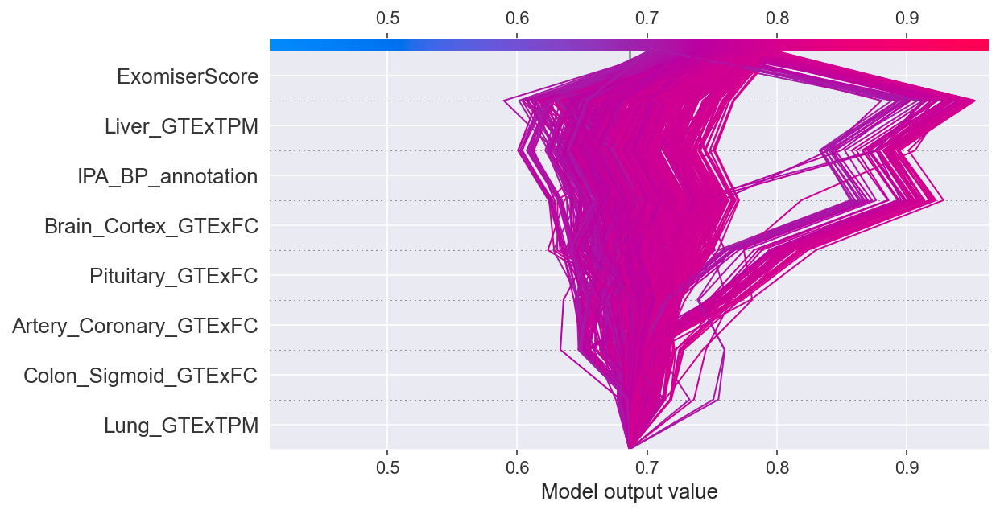

In [106]:
y_pred = cat.predict(X2)
T = X2[(y_pred >= 0.7) & (y_pred <= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [107]:
smallest = df_total.nsmallest(10, "cat_Score", keep="last")

smallest[['Gene', 'cat_Score']]

,Gene,xgb_Score
1692,UFL1-AS1,0.102440
1316,RP11-382A20.7,0.102650
372,CTD-2033A16.3,0.102650
778,LY6G6F,0.103893
1320,RP11-432I5.2,0.104274
1360,RP11-734C14.2,0.104419
67,AGBL4,0.105703
1744,YBX1P6,0.107079
1403,RPS20P2,0.107079
1285,RP11-283G6.4,0.107079


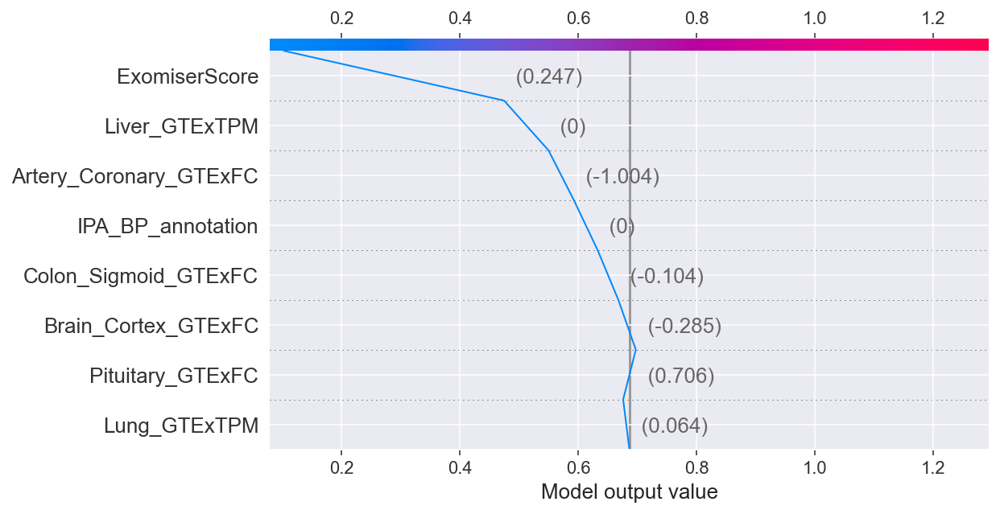

In [108]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1692], X2.iloc[1692])

In [109]:
gene1 = df_total[df_total["Gene"].str.contains("BDNF-AS")]
print(gene1)

        Gene  REVEL.max  MetaSVM_rankscore.max  MetaLR_rankscore.max  \
167  BDNF-AS        NaN                    NaN                   NaN   

     MCAP.max  minP.min.min  minP.min.max  wgEncodeBroadHmmHuvecHMM.count  \
167       NaN           NaN           NaN                              24   

     betamax  logpval_gwascatalog  ...  GTEx_signif_sexbias  HIPred  \
167   0.6259            16.522879  ...                  1.0     NaN   

     IPA_BP_annotation  IPA_Activity  O_GlcNAc_Score  EMS_Max  PharmGKB_Score  \
167                  0             0             NaN      NaN            3.25   

     ExAc_constraint_obs_exp  BPlabel  xgb_Score  
167                      NaN  unknown   0.754657  

[1 rows x 143 columns]


In [110]:
X2.iloc[167]

Pituitary_GTExFC          0.178724
Lung_GTExTPM              1.330420
Liver_GTExTPM             0.884741
IPA_BP_annotation         0.000000
ExomiserScore             0.410711
Brain_Cortex_GTExFC       0.179643
Artery_Coronary_GTExFC    0.203383
Colon_Sigmoid_GTExFC      0.186600
Name: 167, dtype: float64

In [111]:
X_importance = X2
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_importance)

shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(167)

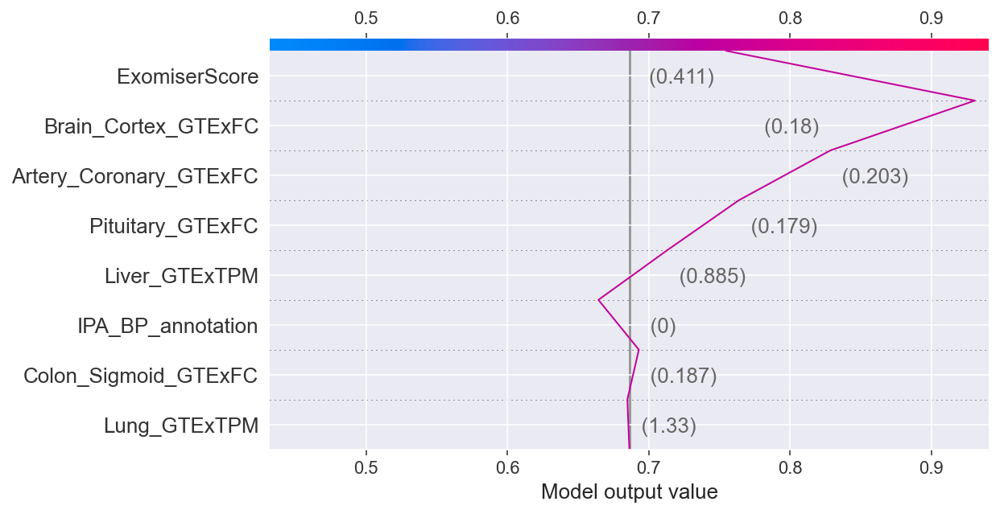

In [109]:
explainer = shap.TreeExplainer(model)

expected_value = explainer.expected_value
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.decision_plot(
    expected_value, shap_values[167], X2.iloc[167], list(features_display)
)